### Imports

In [1]:
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

# Visualization
import ipyleaflet
import matplotlib.pyplot as plt
from IPython.display import Image
import seaborn as sns


# Data Science
import numpy as np
import pandas as pd

# Feature Engineering
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Machine Learning
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, accuracy_score,classification_report,confusion_matrix

# Planetary Computer Tools
import pystac
import pystac_client
import odc
from pystac_client import Client
from pystac.extensions.eo import EOExtension as eo
from odc.stac import stac_load
import planetary_computer as pc
pc.settings.set_subscription_key('100bbb6552514f27a2e52ef1be8d93b6')  # SJ's primary key

# Others
import requests
import rich.table
from itertools import cycle
from tqdm import tqdm
import xarray as xr
tqdm.pandas()

### EDA

In [2]:
#Read Data
crop_presence_data = pd.read_csv("Crop_Location_Data.csv")
crop_presence_data

,id,target
0,"(10.18019073690894, 105.32022315786804)",NaN
1,"(10.561107033461816, 105.12772097986661)",NaN
2,"(10.623790611954897, 105.13771401411867)",NaN
3,"(10.583364246115156, 105.23946127195805)",NaN
4,"(10.20744446668854, 105.26844107128906)",NaN
...,...,...
245,"(10.308283266873062, 105.50872812216863)",NaN
246,"(10.582910017285496, 105.23991550078767)",NaN
247,"(10.581547330796518, 105.23991550078767)",NaN
248,"(10.629241357910818, 105.15315779432643)",NaN


In [ ]:
crop_presence_data[crop_presence_data['Latitude and Longitude'].str.contains('10.324635504740822, 105.25572266405916')]

In [ ]:
crop_presence_data.info()

In [ ]:
# Check for class imbalance
sns.countplot(x=crop_presence_data['Class of Land'])
plt.show()

In [4]:
import ast
crop_presence_data['Latitude and Longitude'] = crop_presence_data['Latitude and Longitude'].apply(ast.literal_eval)

### Download Data

In [3]:
from functions import download_radar_data

df = download_radar_data(crop_presence_data['id'], '2022-03-18', '2022-05-18')

  0%|          | 0/250 [00:00<?, ?it/s]

(10.18019073690894, 105.32022315786804)


  0%|          | 1/250 [00:02<10:05,  2.43s/it]

(10.561107033461816, 105.12772097986661)


  1%|          | 2/250 [00:03<07:09,  1.73s/it]

(10.623790611954897, 105.13771401411867)


  1%|          | 3/250 [00:04<05:20,  1.30s/it]

(10.583364246115156, 105.23946127195805)


  2%|▏         | 4/250 [00:05<04:29,  1.09s/it]

(10.20744446668854, 105.26844107128906)


  2%|▏         | 5/250 [00:06<04:25,  1.09s/it]

(10.3101001821917, 105.50872812216863)


  2%|▏         | 6/250 [00:08<06:05,  1.50s/it]

(10.823197068175638, 105.2026687367572)


  3%|▎         | 7/250 [00:09<05:53,  1.45s/it]

(10.579730415477876, 105.15179510783753)


  3%|▎         | 8/250 [00:11<05:19,  1.32s/it]

(10.583364246115156, 105.2390070431284)


  4%|▎         | 9/250 [00:11<04:11,  1.04s/it]

(10.620156781317617, 105.11681948795524)


  4%|▍         | 10/250 [00:12<04:29,  1.12s/it]

(10.822288610516317, 105.20221450792755)


  4%|▍         | 11/250 [00:13<03:51,  1.03it/s]

(10.600170712812577, 105.10137570774748)


  5%|▍         | 12/250 [00:13<03:17,  1.21it/s]

(10.602896085790537, 105.11772794561452)


  5%|▌         | 13/250 [00:14<02:54,  1.36it/s]

(10.507962260391597, 104.96874088949261)


  6%|▌         | 14/250 [00:15<03:03,  1.29it/s]

(10.581093101966857, 105.2390070431284)


  6%|▌         | 15/250 [00:15<02:32,  1.54it/s]

(10.582910017285496, 105.2390070431284)


  6%|▋         | 16/250 [00:16<02:15,  1.73it/s]

(10.193363372969081, 105.30886743712702)


  7%|▋         | 17/250 [00:16<02:29,  1.56it/s]

(10.505691116243296, 104.97101203364079)


  7%|▋         | 18/250 [00:17<02:16,  1.70it/s]

(10.507508031561937, 104.96964934715189)


  8%|▊         | 19/250 [00:17<02:02,  1.89it/s]

(10.213349441474122, 105.3302161921201)


  8%|▊         | 20/250 [00:18<02:20,  1.63it/s]

(10.588814992071077, 105.10137570774748)


  8%|▊         | 21/250 [00:18<02:08,  1.79it/s]

(10.822742839345977, 105.20403142324611)


  9%|▉         | 22/250 [00:19<01:52,  2.02it/s]

(10.621065238976936, 105.14679859071148)


  9%|▉         | 23/250 [00:19<01:47,  2.12it/s]

(10.508416489221258, 104.96874088949261)


 10%|▉         | 24/250 [00:20<01:40,  2.25it/s]

(10.562015491121137, 105.12635829337768)


 10%|█         | 25/250 [00:21<02:20,  1.60it/s]

(10.556110516335558, 105.10682645370315)


 10%|█         | 26/250 [00:21<02:04,  1.80it/s]

(10.225159391045281, 105.28206793617827)


 11%|█         | 27/250 [00:22<02:19,  1.60it/s]

(10.822742839345977, 105.20312296558683)


 11%|█         | 28/250 [00:22<02:06,  1.75it/s]

(10.309191724532381, 105.50872812216863)


 12%|█▏        | 29/250 [00:23<02:25,  1.52it/s]

(10.196997203606362, 105.26162763884446)


 12%|█▏        | 30/250 [00:24<02:33,  1.43it/s]

(10.281029537093461, 105.53416493662849)


 12%|█▏        | 31/250 [00:25<03:22,  1.08it/s]

(10.642868222800617, 105.16360505740815)


 13%|█▎        | 32/250 [00:27<04:00,  1.10s/it]

(10.16610964318948, 105.30614206414918)


 13%|█▎        | 33/250 [00:28<04:06,  1.13s/it]

(10.181099194568262, 105.33203310743866)


 14%|█▎        | 34/250 [00:29<03:59,  1.11s/it]

(10.204719093710581, 105.28025102085971)


 14%|█▍        | 35/250 [00:30<03:12,  1.12it/s]

(10.621065238976936, 105.14906973485968)


 14%|█▍        | 36/250 [00:30<03:09,  1.13it/s]

(10.822742839345977, 105.2026687367572)


 15%|█▍        | 37/250 [00:31<02:45,  1.28it/s]

(10.581093101966857, 105.23946127195805)


 15%|█▌        | 38/250 [00:32<02:48,  1.26it/s]

(10.503874200924656, 104.97101203364079)


 16%|█▌        | 39/250 [00:33<02:49,  1.25it/s]

(10.634692103866737, 105.14407321773365)


 16%|█▌        | 40/250 [00:33<02:22,  1.48it/s]

(10.18654994052418, 105.28751868213396)


 16%|█▋        | 41/250 [00:33<02:05,  1.67it/s]

(10.3101001821917, 105.50918235099826)


 17%|█▋        | 42/250 [00:34<02:21,  1.47it/s]

(10.505236887413638, 104.97146626247044)


 17%|█▋        | 43/250 [00:35<02:03,  1.67it/s]

(10.19790566126568, 105.32022315786804)


 18%|█▊        | 44/250 [00:35<01:53,  1.82it/s]

(10.586543847922776, 105.15997122677103)


 18%|█▊        | 45/250 [00:36<01:45,  1.94it/s]

(10.506599573902617, 104.97101203364079)


 18%|█▊        | 46/250 [00:36<01:38,  2.08it/s]

(10.503419972094997, 104.97146626247044)


 19%|█▉        | 47/250 [00:36<01:34,  2.14it/s]

(10.626061756103198, 105.12772097986661)


 19%|█▉        | 48/250 [00:37<02:02,  1.66it/s]

(10.17882805041996, 105.29796594521568)


 20%|█▉        | 49/250 [00:38<01:47,  1.88it/s]

(10.634692103866737, 105.14679859071148)


 20%|██        | 50/250 [00:38<01:39,  2.00it/s]

(10.280575308263801, 105.53461916545811)


 20%|██        | 51/250 [00:39<02:04,  1.60it/s]

(10.505236887413638, 104.97101203364079)


 21%|██        | 52/250 [00:39<01:56,  1.70it/s]

(10.507962260391597, 104.96919511832223)


 21%|██        | 53/250 [00:41<02:44,  1.20it/s]

(10.507053802732276, 104.97101203364079)


 22%|██▏       | 54/250 [00:41<02:19,  1.40it/s]

(10.506599573902617, 104.97010357598151)


 22%|██▏       | 55/250 [00:42<01:59,  1.63it/s]

(10.823197068175638, 105.20357719441648)


 22%|██▏       | 56/250 [00:42<01:41,  1.92it/s]

(10.589723449730396, 105.10955182668101)


 23%|██▎       | 57/250 [00:43<02:01,  1.59it/s]

(10.566557779417737, 105.1140941149774)


 23%|██▎       | 58/250 [00:44<02:33,  1.25it/s]

(10.822742839345977, 105.20176027909793)


 24%|██▎       | 59/250 [00:45<02:20,  1.35it/s]

(10.581547330796518, 105.2390070431284)


 24%|██▍       | 60/250 [00:46<03:13,  1.02s/it]

(10.226522077534261, 105.30432514883063)


 24%|██▍       | 61/250 [00:47<03:10,  1.01s/it]

(10.630149815570137, 105.1404393870965)


 25%|██▍       | 62/250 [00:48<02:31,  1.24it/s]

(10.564286635269436, 105.11999908976273)


 25%|██▌       | 63/250 [00:48<02:06,  1.48it/s]

(10.583818474944817, 105.23946127195805)


 26%|██▌       | 64/250 [00:48<01:48,  1.71it/s]

(10.503874200924656, 104.97146626247044)


 26%|██▌       | 65/250 [00:49<01:40,  1.84it/s]

(10.30692058038408, 105.50963657982791)


 26%|██▋       | 66/250 [00:50<02:00,  1.53it/s]

(10.583364246115156, 105.23991550078767)


 27%|██▋       | 67/250 [00:50<01:45,  1.74it/s]

(10.15475392244798, 105.29932863170458)


 27%|██▋       | 68/250 [00:51<02:00,  1.51it/s]

(10.507508031561937, 104.97055780481116)


 28%|██▊       | 69/250 [00:51<01:42,  1.76it/s]

(10.280121079434142, 105.53507339428776)


 28%|██▊       | 70/250 [00:52<01:49,  1.65it/s]

(10.187912627013162, 105.33430425158687)


 28%|██▊       | 71/250 [00:53<01:52,  1.59it/s]

(10.582910017285496, 105.23946127195805)


 29%|██▉       | 72/250 [00:53<01:39,  1.80it/s]

(10.28193799475278, 105.53461916545811)


 29%|██▉       | 73/250 [00:53<01:26,  2.04it/s]

(10.577459271329577, 105.10228416540676)


 30%|██▉       | 74/250 [00:54<01:36,  1.82it/s]

(10.504782658583977, 104.97055780481116)


 30%|███       | 75/250 [00:55<01:30,  1.93it/s]

(10.584272703774477, 105.23946127195805)


 30%|███       | 76/250 [00:55<01:24,  2.05it/s]

(10.225613619874942, 105.28797291096359)


 31%|███       | 77/250 [00:56<01:34,  1.84it/s]

(10.17882805041996, 105.2788883343708)


 31%|███       | 78/250 [00:57<02:27,  1.16it/s]

(10.505236887413638, 104.97010357598151)


 32%|███▏      | 79/250 [00:58<02:04,  1.38it/s]

(10.502965743265337, 104.97146626247044)


 32%|███▏      | 80/250 [00:58<01:48,  1.57it/s]

(10.507508031561937, 104.97010357598151)


 32%|███▏      | 81/250 [00:59<01:34,  1.78it/s]

(10.507962260391597, 104.97010357598151)


 33%|███▎      | 82/250 [00:59<01:39,  1.68it/s]

(10.28148376592312, 105.53416493662849)


 33%|███▎      | 83/250 [01:00<01:33,  1.78it/s]

(10.507508031561937, 104.96919511832223)


 34%|███▎      | 84/250 [01:00<01:25,  1.94it/s]

(10.172923075634381, 105.32567390382371)


 34%|███▍      | 85/250 [01:00<01:19,  2.08it/s]

(10.503419972094997, 104.97101203364079)


 34%|███▍      | 86/250 [01:01<01:13,  2.23it/s]

(10.582455788455837, 105.23855281429877)


 35%|███▍      | 87/250 [01:01<01:11,  2.28it/s]

(10.507508031561937, 104.97101203364079)


 35%|███▌      | 88/250 [01:02<01:08,  2.35it/s]

(10.821834381686656, 105.20403142324611)


 36%|███▌      | 89/250 [01:03<01:29,  1.80it/s]

(10.611072204724417, 105.09955879242892)


 36%|███▌      | 90/250 [01:03<01:24,  1.90it/s]

(10.821380152856996, 105.20403142324611)


 36%|███▋      | 91/250 [01:03<01:14,  2.14it/s]

(10.504328429754317, 104.97146626247044)


 37%|███▋      | 92/250 [01:04<01:11,  2.22it/s]

(10.508416489221258, 104.96919511832223)


 37%|███▋      | 93/250 [01:04<01:05,  2.39it/s]

(10.280575308263801, 105.53416493662849)


 38%|███▊      | 94/250 [01:04<01:02,  2.50it/s]

(10.506599573902617, 104.96964934715189)


 38%|███▊      | 95/250 [01:05<00:58,  2.65it/s]

(10.507053802732276, 104.97010357598151)


 38%|███▊      | 96/250 [01:05<01:00,  2.53it/s]

(10.559744346972836, 105.12908366635551)


 39%|███▉      | 97/250 [01:06<01:17,  1.97it/s]

(10.280121079434142, 105.53552762311739)


 39%|███▉      | 98/250 [01:06<01:17,  1.97it/s]

(10.190183771161461, 105.26344455416304)


 40%|███▉      | 99/250 [01:07<01:09,  2.19it/s]

(10.242874315402021, 105.303870920001)


 40%|████      | 100/250 [01:08<01:56,  1.29it/s]

(10.824105525834957, 105.20403142324611)


 40%|████      | 101/250 [01:09<01:41,  1.46it/s]

(10.307829038043401, 105.50963657982791)


 41%|████      | 102/250 [01:10<02:11,  1.12it/s]

(10.308283266873062, 105.50963657982791)


 41%|████      | 103/250 [01:11<01:47,  1.37it/s]

(10.309191724532381, 105.50918235099826)


 42%|████▏     | 104/250 [01:11<01:33,  1.56it/s]

(10.209715610836842, 105.27480027490404)


 42%|████▏     | 105/250 [01:12<01:46,  1.36it/s]

(10.280575308263801, 105.53552762311739)


 42%|████▏     | 106/250 [01:12<01:33,  1.54it/s]

(10.582001559626177, 105.23946127195805)


 43%|████▎     | 107/250 [01:14<02:05,  1.14it/s]

(10.822288610516317, 105.2026687367572)


 43%|████▎     | 108/250 [01:14<01:45,  1.34it/s]

(10.308737495702722, 105.50918235099826)


 44%|████▎     | 109/250 [01:15<01:30,  1.56it/s]

(10.605621458768496, 105.10637222487352)


 44%|████▍     | 110/250 [01:16<02:05,  1.11it/s]

(10.308283266873062, 105.50918235099826)


 44%|████▍     | 111/250 [01:16<01:43,  1.34it/s]

(10.28148376592312, 105.53507339428776)


 45%|████▍     | 112/250 [01:17<01:26,  1.60it/s]

(10.823651297005297, 105.20357719441648)


 45%|████▌     | 113/250 [01:17<01:15,  1.82it/s]

(10.175194219782682, 105.30568783531956)


 46%|████▌     | 114/250 [01:19<01:50,  1.23it/s]

(10.575188127181278, 105.14770704837076)


 46%|████▌     | 115/250 [01:20<01:51,  1.21it/s]

(10.582455788455837, 105.23946127195805)


 46%|████▋     | 116/250 [01:20<01:30,  1.48it/s]

(10.280575308263801, 105.53507339428776)


 47%|████▋     | 117/250 [01:20<01:18,  1.70it/s]

(10.19154645765044, 105.34293459935003)


 47%|████▋     | 118/250 [01:21<01:27,  1.51it/s]

(10.581547330796518, 105.23946127195805)


 48%|████▊     | 119/250 [01:21<01:15,  1.74it/s]

(10.31055441102136, 105.50872812216863)


 48%|████▊     | 120/250 [01:22<01:14,  1.74it/s]

(10.591994593878697, 105.10909759785136)


 48%|████▊     | 121/250 [01:22<01:06,  1.94it/s]

(10.820925924027337, 105.20403142324611)


 49%|████▉     | 122/250 [01:23<00:59,  2.16it/s]

(10.591086136219378, 105.09910456359927)


 49%|████▉     | 123/250 [01:23<00:55,  2.30it/s]

(10.180644965738601, 105.33657539573508)


 50%|████▉     | 124/250 [01:23<00:51,  2.45it/s]

(10.823197068175638, 105.20403142324611)


 50%|█████     | 125/250 [01:24<00:49,  2.52it/s]

(10.504782658583977, 104.97101203364079)


 50%|█████     | 126/250 [01:25<01:03,  1.95it/s]

(10.616977179509997, 105.09637919062143)


 51%|█████     | 127/250 [01:25<01:01,  2.00it/s]

(10.598353797493937, 105.15361202315609)


 51%|█████     | 128/250 [01:26<01:13,  1.66it/s]

(10.507053802732276, 104.96964934715189)


 52%|█████▏    | 129/250 [01:26<01:04,  1.87it/s]

(10.18654994052418, 105.33067042094976)


 52%|█████▏    | 130/250 [01:27<01:01,  1.94it/s]

(10.20517332254024, 105.27979679203008)


 52%|█████▏    | 131/250 [01:28<01:26,  1.38it/s]

(10.30737480921374, 105.50963657982791)


 53%|█████▎    | 132/250 [01:28<01:12,  1.62it/s]

(10.281029537093461, 105.53507339428776)


 53%|█████▎    | 133/250 [01:29<01:06,  1.75it/s]

(10.188821084672481, 105.29978286053424)


 54%|█████▎    | 134/250 [01:29<00:59,  1.95it/s]

(10.282392223582441, 105.53552762311739)


 54%|█████▍    | 135/250 [01:30<00:56,  2.03it/s]

(10.597445339834618, 105.14271053124472)


 54%|█████▍    | 136/250 [01:30<00:50,  2.25it/s]

(10.573371211862636, 105.11454834380703)


 55%|█████▍    | 137/250 [01:31<01:20,  1.41it/s]

(10.281029537093461, 105.53371070779883)


 55%|█████▌    | 138/250 [01:32<01:07,  1.66it/s]

(10.282392223582441, 105.53507339428776)


 56%|█████▌    | 139/250 [01:32<00:57,  1.92it/s]

(10.582001559626177, 105.23855281429877)


 56%|█████▌    | 140/250 [01:33<01:12,  1.51it/s]

(10.507962260391597, 104.96964934715189)


 56%|█████▋    | 141/250 [01:33<01:03,  1.73it/s]

(10.176102677442001, 105.30114554702314)


 57%|█████▋    | 142/250 [01:34<00:54,  1.98it/s]

(10.30692058038408, 105.50918235099826)


 57%|█████▋    | 143/250 [01:34<00:50,  2.14it/s]

(10.506145345072957, 104.97146626247044)


 58%|█████▊    | 144/250 [01:34<00:45,  2.35it/s]

(10.571554296543997, 105.1572458537932)


 58%|█████▊    | 145/250 [01:35<00:55,  1.89it/s]

(10.306012122724761, 105.50918235099826)


 58%|█████▊    | 146/250 [01:36<00:53,  1.96it/s]

(10.582001559626177, 105.23991550078767)


 59%|█████▉    | 147/250 [01:36<00:47,  2.19it/s]

(10.157025066596281, 105.31250126776416)


 59%|█████▉    | 148/250 [01:37<01:03,  1.61it/s]

(10.159296210744582, 105.31204703893451)


 60%|█████▉    | 149/250 [01:39<01:35,  1.06it/s]

(10.283300681241762, 105.53598185194704)


 60%|██████    | 150/250 [01:39<01:17,  1.29it/s]

(10.505691116243296, 104.97146626247044)


 60%|██████    | 151/250 [01:39<01:04,  1.54it/s]

(10.28148376592312, 105.53461916545811)


 61%|██████    | 152/250 [01:40<00:55,  1.76it/s]

(10.21834595860038, 105.30932166595667)


 61%|██████    | 153/250 [01:41<01:04,  1.50it/s]

(10.822742839345977, 105.20357719441648)


 62%|██████▏   | 154/250 [01:42<01:19,  1.21it/s]

(10.309645953362041, 105.50963657982791)


 62%|██████▏   | 155/250 [01:42<01:05,  1.45it/s]

(10.567920465906717, 105.12045331859235)


 62%|██████▏   | 156/250 [01:43<01:05,  1.43it/s]

(10.583818474944817, 105.23991550078767)


 63%|██████▎   | 157/250 [01:43<00:54,  1.70it/s]

(10.628787129081157, 105.12772097986661)


 63%|██████▎   | 158/250 [01:44<00:57,  1.61it/s]

(10.505236887413638, 104.97055780481116)


 64%|██████▎   | 159/250 [01:44<00:49,  1.82it/s]

(10.582001559626177, 105.2390070431284)


 64%|██████▍   | 160/250 [01:45<00:44,  2.01it/s]

(10.823651297005297, 105.20312296558683)


 64%|██████▍   | 161/250 [01:45<00:42,  2.07it/s]

(10.18836685584282, 105.2666241559705)


 65%|██████▍   | 162/250 [01:46<00:47,  1.85it/s]

(10.821380152856996, 105.20357719441648)


 65%|██████▌   | 163/250 [01:46<00:45,  1.90it/s]

(10.506145345072957, 104.97055780481116)


 66%|██████▌   | 164/250 [01:47<00:43,  1.98it/s]

(10.21153252615548, 105.32385698850516)


 66%|██████▌   | 165/250 [01:47<00:38,  2.19it/s]

(10.507053802732276, 104.97146626247044)


 66%|██████▋   | 166/250 [01:48<00:37,  2.23it/s]

(10.309645953362041, 105.50918235099826)


 67%|██████▋   | 167/250 [01:48<00:34,  2.39it/s]

(10.631512502059117, 105.1254498357184)


 67%|██████▋   | 168/250 [01:48<00:32,  2.55it/s]

(10.203356407221602, 105.3234027596755)


 68%|██████▊   | 169/250 [01:49<00:39,  2.06it/s]

(10.505691116243296, 104.97055780481116)


 68%|██████▊   | 170/250 [01:49<00:39,  2.02it/s]

(10.582455788455837, 105.23991550078767)


 68%|██████▊   | 171/250 [01:50<00:36,  2.15it/s]

(10.507053802732276, 104.97055780481116)


 69%|██████▉   | 172/250 [01:50<00:33,  2.35it/s]

(10.18337033871656, 105.28661022447469)


 69%|██████▉   | 173/250 [01:51<00:30,  2.51it/s]

(10.506145345072957, 104.97101203364079)


 70%|██████▉   | 174/250 [01:51<00:29,  2.60it/s]

(10.581547330796518, 105.23855281429877)


 70%|███████   | 175/250 [01:51<00:29,  2.57it/s]

(10.581093101966857, 105.10410108072531)


 70%|███████   | 176/250 [01:52<00:35,  2.09it/s]

(10.22470516221562, 105.27707141905222)


 71%|███████   | 177/250 [01:53<00:46,  1.58it/s]

(10.197451432436022, 105.2984201740453)


 71%|███████   | 178/250 [01:53<00:39,  1.85it/s]

(10.823651297005297, 105.20403142324611)


 72%|███████▏  | 179/250 [01:54<00:34,  2.03it/s]

(10.16111312606322, 105.29433211457857)


 72%|███████▏  | 180/250 [01:54<00:31,  2.23it/s]

(10.506145345072957, 104.96964934715189)


 72%|███████▏  | 181/250 [01:54<00:28,  2.40it/s]

(10.504328429754317, 104.97101203364079)


 73%|███████▎  | 182/250 [01:55<00:26,  2.52it/s]

(10.821834381686656, 105.20312296558683)


 73%|███████▎  | 183/250 [01:55<00:26,  2.57it/s]

(10.160204668403901, 105.29524057223784)


 74%|███████▎  | 184/250 [01:55<00:24,  2.67it/s]

(10.215620585622421, 105.26571569831123)


 74%|███████▍  | 185/250 [01:56<00:23,  2.73it/s]

(10.308737495702722, 105.50872812216863)


 74%|███████▍  | 186/250 [01:56<00:22,  2.85it/s]

(10.822288610516317, 105.20357719441648)


 75%|███████▍  | 187/250 [01:56<00:21,  2.93it/s]

(10.507508031561937, 104.97146626247044)


 75%|███████▌  | 188/250 [01:57<00:21,  2.92it/s]

(10.280121079434142, 105.53461916545811)


 76%|███████▌  | 189/250 [01:57<00:27,  2.19it/s]

(10.30737480921374, 105.50918235099826)


 76%|███████▌  | 190/250 [01:58<00:27,  2.18it/s]

(10.595628424515976, 105.11545680146631)


 76%|███████▋  | 191/250 [01:58<00:25,  2.34it/s]

(10.21153252615548, 105.2720749019262)


 77%|███████▋  | 192/250 [01:59<00:24,  2.35it/s]

(10.619702552487958, 105.16451351506743)


 77%|███████▋  | 193/250 [02:00<00:38,  1.47it/s]

(10.507962260391597, 104.97055780481116)


 78%|███████▊  | 194/250 [02:00<00:33,  1.69it/s]

(10.570191610055016, 105.14089361592616)


 78%|███████▊  | 195/250 [02:01<00:35,  1.54it/s]

(10.823197068175638, 105.20312296558683)


 78%|███████▊  | 196/250 [02:01<00:30,  1.80it/s]

(10.20199372073262, 105.25072614693312)


 79%|███████▉  | 197/250 [02:02<00:32,  1.65it/s]

(10.1829161098869, 105.2984201740453)


 79%|███████▉  | 198/250 [02:03<00:33,  1.55it/s]

(10.2010852630733, 105.3356669380758)


 80%|███████▉  | 199/250 [02:04<00:33,  1.52it/s]

(10.282846452412102, 105.53552762311739)


 80%|████████  | 200/250 [02:04<00:34,  1.44it/s]

(10.309645953362041, 105.50872812216863)


 80%|████████  | 201/250 [02:06<00:46,  1.06it/s]

(10.306466351554421, 105.50918235099826)


 81%|████████  | 202/250 [02:06<00:38,  1.26it/s]

(10.504328429754317, 104.97055780481116)


 81%|████████  | 203/250 [02:07<00:33,  1.42it/s]

(10.615614493021017, 105.09501650413253)


 82%|████████▏ | 204/250 [02:08<00:35,  1.29it/s]

(10.236060882957121, 105.31023012361595)


 82%|████████▏ | 205/250 [02:09<00:39,  1.15it/s]

(10.822742839345977, 105.20221450792755)


 82%|████████▏ | 206/250 [02:09<00:31,  1.40it/s]

(10.639688620992997, 105.1640592862378)


 83%|████████▎ | 207/250 [02:10<00:36,  1.17it/s]

(10.582455788455837, 105.2390070431284)


 83%|████████▎ | 208/250 [02:11<00:35,  1.19it/s]

(10.507962260391597, 104.97101203364079)


 84%|████████▎ | 209/250 [02:12<00:31,  1.30it/s]

(10.507962260391597, 104.97146626247044)


 84%|████████▍ | 210/250 [02:12<00:25,  1.57it/s]

(10.504782658583977, 104.97146626247044)


 84%|████████▍ | 211/250 [02:13<00:21,  1.82it/s]

(10.164746956700501, 105.31250126776416)


 85%|████████▍ | 212/250 [02:13<00:23,  1.61it/s]

(10.571554296543997, 105.12953789518517)


 85%|████████▌ | 213/250 [02:14<00:28,  1.31it/s]

(10.574733898351617, 105.14180207358544)


 86%|████████▌ | 214/250 [02:15<00:26,  1.35it/s]

(10.638780163333678, 105.14679859071148)


 86%|████████▌ | 215/250 [02:16<00:22,  1.54it/s]

(10.307829038043401, 105.50872812216863)


 86%|████████▋ | 216/250 [02:16<00:21,  1.55it/s]

(10.822288610516317, 105.20312296558683)


 87%|████████▋ | 217/250 [02:17<00:18,  1.78it/s]

(10.627424442592176, 105.143618988904)


 87%|████████▋ | 218/250 [02:17<00:16,  1.94it/s]

(10.30737480921374, 105.50872812216863)


 88%|████████▊ | 219/250 [02:17<00:15,  1.99it/s]

(10.19290914413942, 105.30341669117135)


 88%|████████▊ | 220/250 [02:18<00:13,  2.20it/s]

(10.822288610516317, 105.20403142324611)


 88%|████████▊ | 221/250 [02:18<00:12,  2.38it/s]

(10.309191724532381, 105.50963657982791)


 89%|████████▉ | 222/250 [02:18<00:11,  2.42it/s]

(10.308737495702722, 105.50963657982791)


 89%|████████▉ | 223/250 [02:19<00:12,  2.15it/s]

(10.581547330796518, 105.10546376721425)


 90%|████████▉ | 224/250 [02:20<00:17,  1.51it/s]

(10.506599573902617, 104.97146626247044)


 90%|█████████ | 225/250 [02:21<00:14,  1.76it/s]

(10.280575308263801, 105.53371070779883)


 90%|█████████ | 226/250 [02:21<00:15,  1.56it/s]

(10.281029537093461, 105.53552762311739)


 91%|█████████ | 227/250 [02:22<00:13,  1.69it/s]

(10.168380787337782, 105.29342365691926)


 91%|█████████ | 228/250 [02:22<00:12,  1.82it/s]

(10.307829038043401, 105.50918235099826)


 92%|█████████▏| 229/250 [02:23<00:10,  2.06it/s]

(10.282846452412102, 105.53598185194704)


 92%|█████████▏| 230/250 [02:23<00:09,  2.17it/s]

(10.505691116243296, 104.97010357598151)


 92%|█████████▏| 231/250 [02:23<00:08,  2.36it/s]

(10.582910017285496, 105.23855281429877)


 93%|█████████▎| 232/250 [02:24<00:09,  1.81it/s]

(10.506599573902617, 104.97055780481116)


 93%|█████████▎| 233/250 [02:25<00:08,  2.05it/s]

(10.821834381686656, 105.20357719441648)


 94%|█████████▎| 234/250 [02:25<00:07,  2.23it/s]

(10.507053802732276, 104.96919511832223)


 94%|█████████▍| 235/250 [02:25<00:06,  2.37it/s]

(10.28148376592312, 105.53552762311739)


 94%|█████████▍| 236/250 [02:26<00:05,  2.53it/s]

(10.18927531350214, 105.31204703893451)


 95%|█████████▍| 237/250 [02:26<00:05,  2.48it/s]

(10.281029537093461, 105.53461916545811)


 95%|█████████▌| 238/250 [02:26<00:04,  2.52it/s]

(10.28193799475278, 105.53552762311739)


 96%|█████████▌| 239/250 [02:27<00:04,  2.66it/s]

(10.572462754203316, 105.14452744656327)


 96%|█████████▌| 240/250 [02:27<00:03,  2.64it/s]

(10.28193799475278, 105.53507339428776)


 96%|█████████▋| 241/250 [02:28<00:03,  2.62it/s]

(10.181553423397922, 105.3370296245647)


 97%|█████████▋| 242/250 [02:29<00:04,  1.69it/s]

(10.568374694736377, 105.1186364032738)


 97%|█████████▋| 243/250 [02:29<00:04,  1.63it/s]

(10.506145345072957, 104.97010357598151)


 98%|█████████▊| 244/250 [02:30<00:03,  1.85it/s]

(10.583818474944817, 105.2390070431284)


 98%|█████████▊| 245/250 [02:30<00:02,  2.06it/s]

(10.308283266873062, 105.50872812216863)


 98%|█████████▊| 246/250 [02:31<00:02,  1.89it/s]

(10.582910017285496, 105.23991550078767)


 99%|█████████▉| 247/250 [02:31<00:01,  2.07it/s]

(10.581547330796518, 105.23991550078767)


 99%|█████████▉| 248/250 [02:31<00:00,  2.18it/s]

(10.629241357910818, 105.15315779432643)


100%|█████████▉| 249/250 [02:32<00:00,  1.98it/s]

(10.574733898351617, 105.10410108072531)


  0%|          | 0/250 [00:00<?, ?it/s]

(10.18019073690894, 105.32022315786804)


  0%|          | 1/250 [00:01<06:48,  1.64s/it]

(10.561107033461816, 105.12772097986661)


  1%|          | 2/250 [00:02<04:23,  1.06s/it]

(10.623790611954897, 105.13771401411867)


  1%|          | 3/250 [00:03<04:24,  1.07s/it]

(10.583364246115156, 105.23946127195805)


  2%|▏         | 4/250 [00:04<05:08,  1.25s/it]

(10.20744446668854, 105.26844107128906)


  2%|▏         | 5/250 [00:05<04:43,  1.16s/it]

(10.3101001821917, 105.50872812216863)


  2%|▏         | 6/250 [00:06<04:26,  1.09s/it]

(10.823197068175638, 105.2026687367572)


  3%|▎         | 7/250 [00:07<04:03,  1.00s/it]

(10.579730415477876, 105.15179510783753)


  3%|▎         | 8/250 [00:08<04:12,  1.04s/it]

(10.583364246115156, 105.2390070431284)


  4%|▎         | 9/250 [00:09<03:18,  1.22it/s]

(10.620156781317617, 105.11681948795524)


  4%|▍         | 10/250 [00:09<03:13,  1.24it/s]

(10.822288610516317, 105.20221450792755)


  4%|▍         | 11/250 [00:10<02:44,  1.46it/s]

(10.600170712812577, 105.10137570774748)


  5%|▍         | 12/250 [00:10<02:17,  1.73it/s]

(10.602896085790537, 105.11772794561452)


  5%|▌         | 13/250 [00:11<02:06,  1.87it/s]

(10.507962260391597, 104.96874088949261)


  6%|▌         | 14/250 [00:11<02:18,  1.71it/s]

(10.581093101966857, 105.2390070431284)


  6%|▌         | 15/250 [00:12<02:08,  1.83it/s]

(10.582910017285496, 105.2390070431284)


  6%|▋         | 16/250 [00:12<01:56,  2.00it/s]

(10.193363372969081, 105.30886743712702)


  7%|▋         | 17/250 [00:13<02:18,  1.68it/s]

(10.505691116243296, 104.97101203364079)


  7%|▋         | 18/250 [00:13<01:59,  1.94it/s]

(10.507508031561937, 104.96964934715189)


  8%|▊         | 19/250 [00:14<01:49,  2.12it/s]

(10.213349441474122, 105.3302161921201)


  8%|▊         | 20/250 [00:15<02:28,  1.55it/s]

(10.588814992071077, 105.10137570774748)


  8%|▊         | 21/250 [00:15<02:08,  1.79it/s]

(10.822742839345977, 105.20403142324611)


  9%|▉         | 22/250 [00:15<01:57,  1.94it/s]

(10.621065238976936, 105.14679859071148)


  9%|▉         | 23/250 [00:16<01:45,  2.16it/s]

(10.508416489221258, 104.96874088949261)


 10%|▉         | 24/250 [00:16<01:35,  2.37it/s]

(10.562015491121137, 105.12635829337768)


 10%|█         | 25/250 [00:17<02:22,  1.58it/s]

(10.556110516335558, 105.10682645370315)


 10%|█         | 26/250 [00:18<02:02,  1.83it/s]

(10.225159391045281, 105.28206793617827)


 11%|█         | 27/250 [00:18<02:11,  1.70it/s]

(10.822742839345977, 105.20312296558683)


 11%|█         | 28/250 [00:19<01:55,  1.92it/s]

(10.309191724532381, 105.50872812216863)


 12%|█▏        | 29/250 [00:19<02:08,  1.72it/s]

(10.196997203606362, 105.26162763884446)


 12%|█▏        | 30/250 [00:20<02:18,  1.59it/s]

(10.281029537093461, 105.53416493662849)


 12%|█▏        | 31/250 [00:21<02:22,  1.54it/s]

(10.642868222800617, 105.16360505740815)


 13%|█▎        | 32/250 [00:23<04:16,  1.18s/it]

(10.16610964318948, 105.30614206414918)


 13%|█▎        | 33/250 [00:24<04:05,  1.13s/it]

(10.181099194568262, 105.33203310743866)


 14%|█▎        | 34/250 [00:25<03:46,  1.05s/it]

(10.204719093710581, 105.28025102085971)


 14%|█▍        | 35/250 [00:26<03:09,  1.14it/s]

(10.621065238976936, 105.14906973485968)


 14%|█▍        | 36/250 [00:26<03:02,  1.17it/s]

(10.822742839345977, 105.2026687367572)


 15%|█▍        | 37/250 [00:27<02:30,  1.41it/s]

(10.581093101966857, 105.23946127195805)


 15%|█▌        | 38/250 [00:27<02:29,  1.42it/s]

(10.503874200924656, 104.97101203364079)


 15%|█▌        | 38/250 [00:28<02:39,  1.33it/s]


KeyboardInterrupt: 

In [21]:
data_vh_vv

,date,vh,vv
0,2022-01-01/2022-02-01,0.017495941,0.13887902
1,2022-01-01/2022-02-01,0.028679391,0.07264892
2,2022-01-01/2022-02-01,0.02452453,0.1986736
3,2022-01-01/2022-02-01,0.004701866,0.012505684
4,2022-01-01/2022-02-01,0.015977064,0.023961633
...,...,...,...
995,2022-04-01/2022-05-01,0.0044893655,0.017656408
996,2022-04-01/2022-05-01,0.004491235,0.02138837
997,2022-04-01/2022-05-01,0.004278449,0.016030608
998,2022-04-01/2022-05-01,0.0071336497,0.027761186


In [451]:
# eval_data = pd.read_csv('./Eval/data__val_2022-01-01_2022-3-01.csv')
# eval_data2 = pd.read_csv('./Eval/data__val_2022-05-01_2022-9-01.csv')
# eval_data3 = pd.read_csv('./Eval/data__val_2022-09-01_2022-12-31.csv')
# eval_df = pd.concat([eval_data, eval_data2, eval_data3], axis=0)

In [481]:
eval_df = pd.read_csv('./Eval/data_eval_2022-01-01_2022-12-01.csv')

In [482]:
eval_df

,vh,vv,rvi,rvi_ma
0,0.017496,0.138879,0.447538,NaN
1,0.028679,0.072649,1.132137,NaN
2,0.024525,0.198674,0.439511,NaN
3,0.004702,0.012506,1.092977,NaN
4,0.015977,0.023962,1.600159,NaN
...,...,...,...,...
2995,0.005153,0.010679,1.301841,0.797120
2996,0.004101,0.011411,1.057531,0.857121
2997,0.004101,0.014649,0.874887,0.865453
2998,0.008816,0.026985,0.985011,0.961311


In [678]:
data_1 = pd.read_csv('data_2022-01-01_2022-05-01.csv')
data_2 = pd.read_csv('data_2022-04-01_2022-07-01.csv')
data_3 = pd.read_csv('data_2022-07-01_2022-11-01.csv')
data_4 = pd.read_csv('data_2022-11-01_2023-01-01.csv')

In [679]:
data_df = pd.concat([data_1, data_2, data_3, data_4], axis=0)
data_df.shape

(7200, 3)

In [680]:
data_df

,date,vh,vv
0,2022-01-01/2022-02-01,0.027253,0.141300
1,2022-01-01/2022-02-01,0.019327,0.398268
2,2022-01-01/2022-02-01,0.033112,0.143685
3,2022-01-01/2022-02-01,0.033152,0.121286
4,2022-01-01/2022-02-01,0.022331,0.205135
...,...,...,...
1195,2022-12-01/2023-01-01,0.056471,0.160070
1196,2022-12-01/2023-01-01,0.054658,0.167050
1197,2022-12-01/2023-01-01,0.055214,0.236458
1198,2022-12-01/2023-01-01,0.048543,0.255147


In [181]:
data_df.head()

,date,vh,vv
0,2022-01-01/2022-02-01,0.027253,0.141300
1,2022-01-01/2022-02-01,0.019327,0.398268
2,2022-01-01/2022-02-01,0.033112,0.143685
3,2022-01-01/2022-02-01,0.033152,0.121286
4,2022-01-01/2022-02-01,0.022331,0.205135


### Process Data

### Pipe

#### Funcs

In [218]:
from sklearn.compose import ColumnTransformer
import xarray as xr

def calculate_rvi(df) -> pd.DataFrame:
    ''' Return pd.DataFrame with calculated RVI Column
    Attributes:
    df (pd.DataFrame)
    '''
    df = df.assign(rvi = lambda x: ((4*x.vh)/(x.vv+x.vh)))
    return df


def _calc_ma(x, period) -> float:
    '''Calculate MA
    Attributes:
    x (np.array)
    period (int) - Window in days to calculate the moving average with
    Returns:
    float'''
    return x.rolling(window=period).mean()


def calculate_ma(df, period) -> pd.DataFrame:
    '''Return pd.DataFrame with calculated MA column
    Attributes:
    df (pd.DataFrame)
    period (int) - Window in days to calculate the moving average with'''
    
    df = df.assign(rvi_ma = lambda x: _calc_ma(x.rvi, period)) # Calculate moving average with a window of 'period' days
    return df


def assign_index(df) -> pd.DataFrame:
    '''Assign field indexes to the DataFrame
    Attributes:
    df (pd.DataFrame)
    Returns:
    pd.DataFrame'''

    new_index = [i % int(len(df)/12) for i in range(len(df))] # Get Field Index Values
    
    df['field'] = new_index # Assign the new index values to the DataFrame

    return df


def merge_dfs(df, crop) -> pd.DataFrame:
    '''Merges DataFrame containing downloaded data and the original input DataFrame with field information
    Attributes:
    df (pd.DataFrame) - downloaded satellite data
    crop (pd.DataFrame) - original input data with field information
    Returns:
    pd.DataFrame'''
    
    # Unifying columns names if they are not set correctly
    if 'target' in crop.columns:
        crop.target= 0
        crop.columns = ['Latitude and Longitude', 'Class of Land']
    
    crop = crop.reset_index()
    
    # Merging DataFrames
    df = df.merge(crop, left_on='field', right_on=crop['index'])
    df = df.drop('Latitude and Longitude', axis=1)
    df = df.drop('Class of Land', axis=1)
    
    return df


def xr_transform(df) -> pd.DataFrame:
    '''Sets required dimensionality for the DataFrame
    Attributes (pd.DataFrame)
    Returns:
    pd.DataFrame'''
    
    df = df.drop('index', axis=1)
    ds = df.set_index(['field', 'date']).to_xarray()
    ds.set_coords('date')
    
    df_full = ds.to_dataframe()
    return df_full


#### Col Transformer


In [219]:
from sklearn.base import BaseEstimator, TransformerMixin

class CustomColumnTransformer(BaseEstimator, TransformerMixin):
    def __init__(self,crop_info_path='Crop_Location_Data_or.csv' ,ma_window=7):
        self.crop_info_path=crop_info_path
        self.ma_window = ma_window
    
    def fit(self, X, crop_info_path='Crop_Location_Data.csv', y=None):
        return self
    
    def transform(self, X):
        # Step 1: Calculate RVI
        X = calculate_rvi(X)
        
        # Step 2: Calculate moving average with a window of ma_window days
        X = calculate_ma(X, self.ma_window)
        
        # Step 3: Assign new index values to the DataFrame
        X = assign_index(X)
        
        
        # Step 4: Merge the input DataFrame with the crop information
        crop = pd.read_csv(self.crop_info_path)
        
        X = merge_dfs(X, crop)
    
        # Step 5: Transform the DataFrame to xarray format and drop the 'target' dimension
        X = xr_transform(X)
        
        # Return the transformed DataFrame
        return X

#### Clustering


In [178]:
import matplotlib.pyplot as plt
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.clustering import KShape
from tslearn.metrics import cdist_dtw
from sklearn.metrics import silhouette_score

class TimeSeriesClusteringTransformer(BaseEstimator, TransformerMixin):
    
    def __init__(self, n_clusters=7, window_size=2,mean_of_o = 0.0,std = 1.0):
        self.n_clusters = n_clusters
        self.window_size = window_size
        self.mean_of_o = mean_of_o
        self.std = std
        self.scaler = None
        self.kshape = None
        
    def fit(self, X, y=None):
        # Assuming your data is in a pandas Series called 'data'
        data = pd.Series(X['rvi_ma'].fillna(0))

        # Create a DataFrame from your data
        df = data.reset_index()

        # Pivot the DataFrame to create a 2D array where each row represents a time series
        pivot_df = df.pivot_table(values='rvi_ma', index='field', columns='date')

        # Convert the pivoted DataFrame to a 2D numpy array
        time_series_data = pivot_df.to_numpy()

        ## Apply Moving Average (MA)
        # Apply Simple Moving Average (SMA) with a window size of your choice
        time_series_data_sma = pivot_df.rolling(window=self.window_size, axis=1).mean()

        # Drop any rows with NaN values due to the rolling window operation
        time_series_data_sma.dropna(axis=1, inplace=True)

        # Convert the pivoted DataFrame with SMA to a 2D numpy array
        time_series_data = time_series_data_sma.to_numpy()

        ## Scale time series
        self.scaler = TimeSeriesScalerMeanVariance(mu=mean_of_o, std=std)
        self.scaler.fit(time_series_data)

        ## Perform time series clustering using k-Shape 
        self.kshape = KShape(n_clusters=self.n_clusters, n_init=10, verbose=False, random_state=42)
        self.kshape.fit(self.scaler.transform(time_series_data))

        return self
    
    def transform(self, X, y=None):
        
        # Assuming your data is in a pandas Series called 'data'
        data = pd.Series(X['rvi_ma'].fillna(0))

        # Create a DataFrame from your data
        df = data.reset_index()

        # Pivot the DataFrame to create a 2D array where each row represents a time series
        pivot_df = df.pivot_table(values='rvi_ma', index='field', columns='date')

        # Convert the pivoted DataFrame to a 2D numpy array
        time_series_data = pivot_df.to_numpy()

        ## Apply Moving Average (MA)
        # Apply Simple Moving Average (SMA) with a window size of your choice
        window_size = self.window_size
        time_series_data_sma = pivot_df.rolling(window=window_size, axis=1).mean()

        # Drop any rows with NaN values due to the rolling window operation
        time_series_data_sma.dropna(axis=1, inplace=True)

        # Convert the pivoted DataFrame with SMA to a 2D numpy array
        time_series_data = time_series_data_sma.to_numpy()

        ## Scale time series
        time_series_data_scaled = self.scaler.transform(time_series_data)

        ## Perform time series clustering using k-Shape
        y_pred = self.kshape.predict(time_series_data_scaled)

        # Calculate the distance matrix using Dynamic Time Warping (DTW)
        distance_matrix = cdist_dtw(time_series_data_scaled)

        # Calculate the silhouette score
        silhouette = silhouette_score(distance_matrix, y_pred, metric='precomputed')
        
        # Return the transformed data and silhouette score as a tuple
        return time_series_data_scaled, y_pred, silhouette, pivot_df, time_series_data


## Run Pipe

#### Loop Through Cluster/Window Combinations


In [236]:
# Create a column transformer with the custom transformer as a step


from sklearn.pipeline import Pipeline

for w in np.arange(1,6):

    for n in np.arange(2,10):
        custom_col_transformer = Pipeline([
            ('custom', CustomColumnTransformer(ma_window=7)),
            ('timeseries',TimeSeriesClusteringTransformer(n_clusters=n, window_size=w))
        ])


        time_series_data_scaled, y_pred, silhouette, pivot_df, time_series_data = custom_col_transformer.fit_transform(data_df)
        print(f'Silhouette score for {n} clusters while {w} window: {silhouette}')



Silhouette score for 2 clusters while 1 window: 0.18295929317262366
Silhouette score for 3 clusters while 1 window: 0.2572377088101147
Silhouette score for 4 clusters while 1 window: 0.3345988221149069
Silhouette score for 5 clusters while 1 window: 0.30419237051835707
Silhouette score for 6 clusters while 1 window: 0.25034691301349765
Silhouette score for 7 clusters while 1 window: 0.3251146600015716
Silhouette score for 8 clusters while 1 window: 0.2926957832710938
Silhouette score for 9 clusters while 1 window: 0.3613372939268458
Silhouette score for 2 clusters while 2 window: 0.22893223396985102
Silhouette score for 3 clusters while 2 window: 0.2348084804793439
Silhouette score for 4 clusters while 2 window: 0.33780527619703754
Silhouette score for 5 clusters while 2 window: 0.2959036080325608
Silhouette score for 6 clusters while 2 window: 0.2960103625268942
Silhouette score for 7 clusters while 2 window: 0.3109292916886873
Silhouette score for 8 clusters while 2 window: 0.2741156

In [237]:
# Load Downloaded Data
data_val = pd.concat([
    pd.read_csv('./Eval/data__val_2022-01-01_2022-3-01.csv'),
    pd.read_csv('./Eval/data__val_2022-05-01_2022-9-01.csv'),
    pd.read_csv('./Eval/data__val_2022-09-01_2022-12-31.csv')], axis=0)

In [220]:
# Use Col Transformer on Training Data

custom_col_transformer_train = Pipeline([
    ('custom', CustomColumnTransformer(ma_window=7, crop_info_path='Crop_Location_Data_or.csv'))
])
df_train = custom_col_transformer_train.transform(data_df)


In [222]:
# Use Col Transformer on Evaluation Data

custom_col_transformer_eval = Pipeline([
    ('custom', CustomColumnTransformer(ma_window=7, crop_info_path='Crop_Location_Data.csv'))
])
df_eval = custom_col_transformer_eval.transform(data_val)


In [223]:
# Fit Clustering on Training Data
custom_transformer=Pipeline([
    ('timeseries',TimeSeriesClusteringTransformer(n_clusters=9, window_size=1))])

time_series_data_scaled, y_pred, silhouette, pivot_df, time_series_data = custom_transformer.fit_transform(df_train)



In [226]:
# Cluster Evaluation Data
time_series_data_scaled, y_pred, silhouette, pivot_df, time_series_data = custom_transformer.transform(df_eval)

#### Calculate Cluster Stats and Save

In [227]:
# Create a DataFrame to store the time series data and the cluster labels
result_df = pivot_df.copy()
result_df['Cluster'] = y_pred

# Calculate statistical information for each cluster and add to the result DataFrame
for cluster in range(9):
    cluster_data = time_series_data[y_pred == cluster]

    # Calculate mean and variance
    cluster_mean = np.mean(cluster_data, axis=0)
    cluster_variance = np.var(cluster_data, axis=0)

    # Calculate autocorrelation
    cluster_data_df = pd.DataFrame(cluster_data)
    cluster_autocorr = cluster_data_df.apply(lambda x: x.autocorr(), axis=1).mean()

    # Add statistical information to the result DataFrame
    result_df.loc[result_df['Cluster'] == cluster, 'Mean'] = cluster_mean.mean()
    result_df.loc[result_df['Cluster'] == cluster, 'Variance'] = cluster_variance.mean()
    result_df.loc[result_df['Cluster'] == cluster, 'Autocorrelation'] = cluster_autocorr

# Print the result
result_df.head()

date,2022-01-01/2022-02-01,2022-02-01/2022-03-01,2022-03-01/2022-04-01,2022-04-01/2022-05-01,2022-05-01/2022-06-01,2022-06-01/2022-07-01,2022-07-01/2022-08-01,2022-08-01/2022-09-01,2022-09-01/2022-10-01,2022-10-01/2022-11-01,2022-11-01/2022-12-01,2022-12-01/2023-01-01,Cluster,Mean,Variance,Autocorrelation
field,,,,,,,,,,,,,,,,
0,0.000000,0.973352,1.037454,0.718521,0.713552,0.843898,0.924379,0.847611,0.898204,0.753607,0.964014,0.854759,6,0.811386,0.018169,-0.054750
1,0.000000,0.949083,1.040288,0.651643,0.712497,0.790825,0.907105,0.889550,0.875829,0.773875,0.899711,0.776912,6,0.811386,0.018169,-0.054750
2,0.000000,0.883972,1.061897,0.621888,0.654391,0.818551,0.924291,0.899777,0.732878,0.747948,0.866053,0.805221,6,0.811386,0.018169,-0.054750
3,0.000000,0.879501,1.017547,0.609568,0.711131,0.824175,0.947057,0.964191,0.734790,0.757648,0.840425,0.818994,6,0.811386,0.018169,-0.054750
4,0.000000,0.821034,0.965313,0.609534,0.816646,0.849972,0.883926,0.914195,0.744638,0.844665,0.748775,0.725431,6,0.811386,0.018169,-0.054750
5,0.000000,0.819761,0.953183,0.594237,0.856766,0.943955,0.809745,0.918703,0.840613,1.003497,0.769390,0.751937,6,0.811386,0.018169,-0.054750
6,0.931281,0.871058,0.899105,0.504124,0.850190,0.975274,0.710787,0.875965,0.826514,1.066500,0.817598,0.681545,4,0.808890,0.009472,0.005227
7,1.003056,0.895563,0.883022,0.535031,0.925964,1.071337,0.747690,0.867488,0.754348,1.011026,0.773781,0.690937,6,0.811386,0.018169,-0.054750
8,1.023495,0.893867,0.864941,0.597985,0.973518,1.056002,0.783838,0.882109,0.767981,1.033844,0.790014,0.774978,6,0.811386,0.018169,-0.054750


In [228]:
# Save to disk
result_df.to_csv('time_series_clustering_9c_1w_eval.csv', index=False)

In [229]:
result_df.Cluster.unique()

array([6, 4, 0, 5, 1, 3, 7, 8, 2], dtype=int64)

# OG Code

In [331]:
pd.read_csv('Crop_Location_Data.csv')

,Latitude and Longitude,Class of Land
0,"(10.323727047081501, 105.2516346045924)",Rice
1,"(10.322364360592521, 105.27843410554115)",Rice
2,"(10.321455902933202, 105.25254306225168)",Rice
3,"(10.324181275911162, 105.25118037576274)",Rice
4,"(10.324635504740822, 105.27389181724476)",Rice
...,...,...
595,"(10.013942985253381, 105.67361318732796)",Non Rice
596,"(10.01348875642372, 105.67361318732796)",Non Rice
597,"(10.013034527594062, 105.67361318732796)",Non Rice
598,"(10.012580298764401, 105.67361318732796)",Non Rice


In [581]:
eval_df = pd.read_csv('./Eval/data_eval_2022-01-01_2022-12-01.csv')

In [582]:
eval_df = eval_df.assign(rvi = lambda x: ((4*x.vh)/(x.vv+x.vh)))

In [681]:
data_df = data_df.assign(rvi = lambda x: ((4*x.vh)/(x.vv+x.vh)))


In [682]:
# Calculate moving average with a window of 7 days
def _calculate_ma(x, period) -> float:
    return x.rolling(window=period).mean()

In [683]:
eval_df = eval_df.assign(rvi_ma = lambda x: _calculate_ma(x.rvi, 7))

In [690]:
data_df = data_df.assign(rvi_ma = lambda x: _calculate_ma(x.rvi, 7))

In [586]:
eval_df

,vh,vv,rvi,rvi_ma
0,0.017496,0.138879,0.447538,NaN
1,0.028679,0.072649,1.132137,NaN
2,0.024525,0.198674,0.439511,NaN
3,0.004702,0.012506,1.092977,NaN
4,0.015977,0.023962,1.600159,NaN
...,...,...,...,...
2995,0.005153,0.010679,1.301841,0.797120
2996,0.004101,0.011411,1.057531,0.857121
2997,0.004101,0.014649,0.874887,0.865453
2998,0.008816,0.026985,0.985011,0.961311


In [693]:
data_df= data_df.reset_index(drop=True)

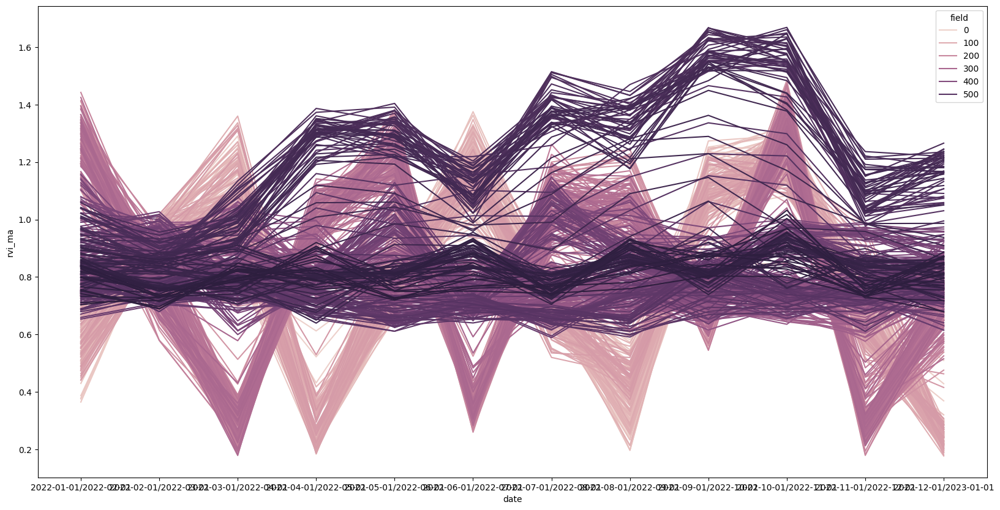

In [694]:
# setting the dimensions of the plot
fig, ax = plt.subplots(figsize=(20, 10))

sns.lineplot(data=data_df, x="date", y="rvi_ma", hue="field")

fig.savefig("data.png") 

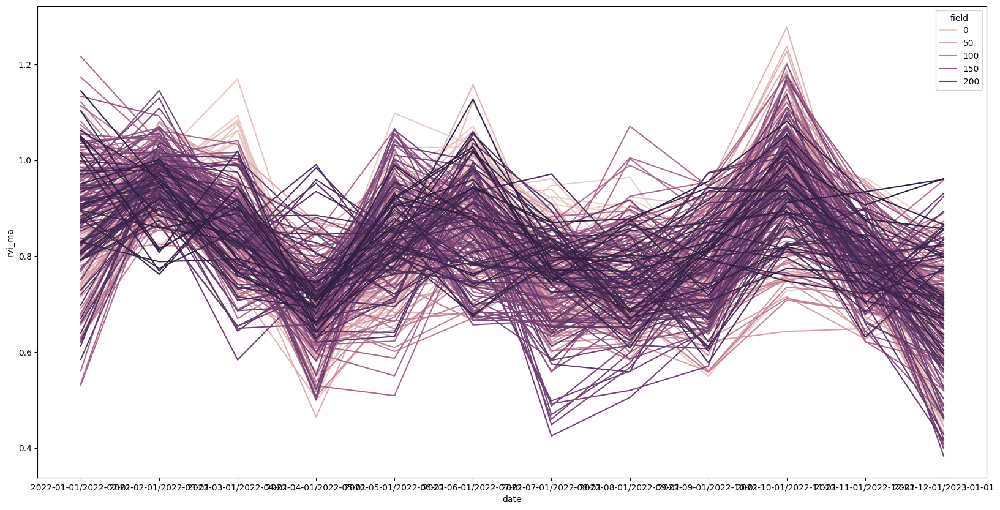

In [597]:
# setting the dimensions of the plot
fig, ax = plt.subplots(figsize=(20, 10))

sns.lineplot(data=eval_df2.reset_index(), x="date", y="rvi_ma", hue="field")

fig.savefig("data.png") 

In [130]:
data_df = data_df.assign(rvi_ma = lambda x: calculate_ma(x.rvi, 7))

AttributeError: 'Series' object has no attribute 'assign'

In [542]:
eval_df2

,field,date,vh,vv,rvi,rvi_ma
0,0,2022-01-01/2022-02-01,0.017496,0.138879,0.447538,0.000000
1,1,2022-01-01/2022-02-01,0.028679,0.072649,1.132137,0.000000
2,2,2022-01-01/2022-02-01,0.024525,0.198674,0.439511,0.000000
3,3,2022-01-01/2022-02-01,0.004702,0.012506,1.092977,0.000000
4,4,2022-01-01/2022-02-01,0.015977,0.023962,1.600159,0.000000
...,...,...,...,...,...,...
2995,245,2022-12-01/2023-01-01,0.005153,0.010679,1.301841,0.797120
2996,246,2022-12-01/2023-01-01,0.004101,0.011411,1.057531,0.857121
2997,247,2022-12-01/2023-01-01,0.004101,0.014649,0.874887,0.865453
2998,248,2022-12-01/2023-01-01,0.008816,0.026985,0.985011,0.961311


In [587]:
dates = ['2022-01-01/2022-02-01', '2022-02-01/2022-03-01',
       '2022-03-01/2022-04-01', '2022-04-01/2022-05-01',
       '2022-05-01/2022-06-01', '2022-06-01/2022-07-01',
       '2022-07-01/2022-08-01', '2022-08-01/2022-09-01',
       '2022-09-01/2022-10-01', '2022-10-01/2022-11-01',
       '2022-11-01/2022-12-01', '2022-12-01/2023-01-01']

In [685]:
new_date_col = []
for date in dates:
    for i in range(250):
        new_date_col.append(date)
    

In [589]:
eval_df['date'] = new_date_col

In [590]:
eval_df2 = eval_df.copy()

new_index = [i % 250 for i in range(len(eval_df2))]

# Assign the new index values to the DataFrame
eval_df2['field'] = new_index
eval_df2 = eval_df2.set_index(['field', 'date'])

In [687]:
data_df2 = data_df

new_index = [i % 600 for i in range(len(data_df2))]

# Assign the new index values to the DataFrame
data_df2['field'] = new_index
data_df2 = data_df2.set_index(['field', 'date'])

In [18]:
#  crop field info for train data
crop_field = pd.read_csv('Crop_Location_Data_or.csv')

In [591]:
eval_df2

,,vh,vv,rvi,rvi_ma
field,date,,,,
0,2022-01-01/2022-02-01,0.017496,0.138879,0.447538,NaN
1,2022-01-01/2022-02-01,0.028679,0.072649,1.132137,NaN
2,2022-01-01/2022-02-01,0.024525,0.198674,0.439511,NaN
3,2022-01-01/2022-02-01,0.004702,0.012506,1.092977,NaN
4,2022-01-01/2022-02-01,0.015977,0.023962,1.600159,NaN
...,...,...,...,...,...
245,2022-12-01/2023-01-01,0.005153,0.010679,1.301841,0.797120
246,2022-12-01/2023-01-01,0.004101,0.011411,1.057531,0.857121
247,2022-12-01/2023-01-01,0.004101,0.014649,0.874887,0.865453


In [598]:

eval_df2 = eval_df2.fillna(0)

In [247]:
# Crop Data for Eval

crop_presence_data = pd.read_csv('Crop_Location_Data.csv')

In [522]:
crop_presence_data = crop_presence_data.reset_index()

In [599]:
eval_df2 = eval_df2.reset_index()

In [ ]:
crop_presence_data

In [600]:
evdf = eval_df2.merge(crop_presence_data, left_on='field', right_on='index')
evdf.shape

(3000, 9)

In [601]:
evdf

,field,date,vh,vv,rvi,rvi_ma,index,id,target
0,0,2022-01-01/2022-02-01,0.017496,0.138879,0.447538,0.000000,0,"(10.18019073690894, 105.32022315786804)",NaN
1,0,2022-02-01/2022-03-01,0.021457,0.077430,0.867933,0.973352,0,"(10.18019073690894, 105.32022315786804)",NaN
2,0,2022-03-01/2022-04-01,0.049652,0.107100,1.267032,1.037454,0,"(10.18019073690894, 105.32022315786804)",NaN
3,0,2022-04-01/2022-05-01,0.010012,0.211631,0.180687,0.718521,0,"(10.18019073690894, 105.32022315786804)",NaN
4,0,2022-05-01/2022-06-01,0.018746,0.171211,0.394747,0.713552,0,"(10.18019073690894, 105.32022315786804)",NaN
...,...,...,...,...,...,...,...,...,...
2995,249,2022-08-01/2022-09-01,0.006859,0.026705,0.817436,0.877499,249,"(10.574733898351617, 105.10410108072531)",NaN
2996,249,2022-09-01/2022-10-01,0.007096,0.104388,0.254615,0.718667,249,"(10.574733898351617, 105.10410108072531)",NaN
2997,249,2022-10-01/2022-11-01,0.017523,0.224434,0.289689,0.911711,249,"(10.574733898351617, 105.10410108072531)",NaN
2998,249,2022-11-01/2022-12-01,0.035081,0.095839,1.071840,0.934069,249,"(10.574733898351617, 105.10410108072531)",NaN


In [155]:
df = data_df.merge(crop_field, left_on='field', right_on=crop_field.index)
df.shape

(7200, 7)

In [318]:
evdf

,field,date,vh,vv,rvi,rvi_ma,index,id,target
0,0,2022-01-01/2022-02-01,0.017496,0.138879,0.447538,0.000000,0,"(10.18019073690894, 105.32022315786804)",NaN
1,0,2022-02-01/2022-03-01,0.021457,0.077430,0.867933,0.000000,0,"(10.18019073690894, 105.32022315786804)",NaN
2,0,2022-03-01/2022-04-01,0.049652,0.107100,1.267032,0.000000,0,"(10.18019073690894, 105.32022315786804)",NaN
3,0,2022-04-01/2022-05-01,0.010012,0.211631,0.180687,0.000000,0,"(10.18019073690894, 105.32022315786804)",NaN
4,0,2022-05-01/2022-06-01,0.018746,0.171211,0.394747,0.000000,0,"(10.18019073690894, 105.32022315786804)",NaN
...,...,...,...,...,...,...,...,...,...
2995,249,2022-08-01/2022-09-01,0.006859,0.026705,0.817436,0.982740,249,"(10.574733898351617, 105.10410108072531)",NaN
2996,249,2022-09-01/2022-10-01,0.007096,0.104388,0.254615,0.847009,249,"(10.574733898351617, 105.10410108072531)",NaN
2997,249,2022-10-01/2022-11-01,0.017523,0.224434,0.289688,0.696040,249,"(10.574733898351617, 105.10410108072531)",NaN
2998,249,2022-11-01/2022-12-01,0.035081,0.095839,1.071840,0.740887,249,"(10.574733898351617, 105.10410108072531)",NaN


In [602]:
evdf = evdf.drop(['id', 'target', 'index'], axis=1)

In [603]:
evdf

,field,date,vh,vv,rvi,rvi_ma
0,0,2022-01-01/2022-02-01,0.017496,0.138879,0.447538,0.000000
1,0,2022-02-01/2022-03-01,0.021457,0.077430,0.867933,0.973352
2,0,2022-03-01/2022-04-01,0.049652,0.107100,1.267032,1.037454
3,0,2022-04-01/2022-05-01,0.010012,0.211631,0.180687,0.718521
4,0,2022-05-01/2022-06-01,0.018746,0.171211,0.394747,0.713552
...,...,...,...,...,...,...
2995,249,2022-08-01/2022-09-01,0.006859,0.026705,0.817436,0.877499
2996,249,2022-09-01/2022-10-01,0.007096,0.104388,0.254615,0.718667
2997,249,2022-10-01/2022-11-01,0.017523,0.224434,0.289689,0.911711
2998,249,2022-11-01/2022-12-01,0.035081,0.095839,1.071840,0.934069


In [135]:
df = df.drop('Latitude and Longitude', axis=1)
df.shape

(7200, 6)

In [136]:
df = df.rename({'Class of Land':'target'}, axis=1)
df.head()

,date,vh,vv,rvi,field,target
0,2022-01-01/2022-02-01,0.027253,0.141300,0.646754,0,Rice
1,2022-02-01/2022-03-01,0.037834,0.129970,0.901852,0,Rice
2,2022-03-01/2022-04-01,0.031183,0.080205,1.119797,0,Rice
3,2022-04-01/2022-05-01,0.007492,0.181525,0.158537,0,Rice
4,2022-05-01/2022-06-01,0.027550,0.106956,0.819285,0,Rice


In [604]:

evds = evdf.set_index(['field', 'date']).to_xarray()
evds.set_coords('date')

<xarray.Dataset>
Dimensions:  (field: 250, date: 12)
Coordinates:
  * field    (field) int64 0 1 2 3 4 5 6 7 8 ... 242 243 244 245 246 247 248 249
  * date     (date) object '2022-01-01/2022-02-01' ... '2022-12-01/2023-01-01'
Data variables:
    vh       (field, date) float64 0.0175 0.02146 0.04965 ... 0.03508 0.03931
    vv       (field, date) float64 0.1389 0.07743 0.1071 ... 0.09584 0.2017
    rvi      (field, date) float64 0.4475 0.8679 1.267 ... 0.2897 1.072 0.6526
    rvi_ma   (field, date) float64 0.0 0.9734 1.037 ... 0.9117 0.9341 0.9601

In [137]:
import xarray as xr

ds = df.set_index(['field', 'date']).to_xarray()
ds.set_coords('date')

<xarray.Dataset>
Dimensions:  (field: 600, date: 12, target: 2)
Coordinates:
  * field    (field) int64 0 1 2 3 4 5 6 7 8 ... 592 593 594 595 596 597 598 599
  * date     (date) object '2022-01-01/2022-02-01' ... '2022-12-01/2023-01-01'
  * target   (target) object 'Non Rice' 'Rice'
Data variables:
    vh       (field, date, target) float64 nan 0.02725 nan ... nan 0.04236 nan
    vv       (field, date, target) float64 nan 0.1413 nan ... nan 0.2872 nan
    rvi      (field, date, target) float64 nan 0.6468 nan ... nan 0.5141 nan

In [264]:
# Save to disk
# ds.to_netcdf('data.nc')

In [646]:
# Load from disk
import xarray as xr

ds = xr.open_dataset("data.nc")
ds

<xarray.Dataset>
Dimensions:      (field_index: 600, date: 12, target: 2)
Coordinates:
  * field_index  (field_index) int64 0 1 2 3 4 5 6 ... 594 595 596 597 598 599
  * date         (date) object '2022-01-01/2022-02-01' ... '2022-12-01/2023-0...
  * target       (target) object 'Non Rice' 'Rice'
Data variables:
    vh           (field_index, date, target) float64 ...
    vv           (field_index, date, target) float64 ...
    rvi          (field_index, date, target) float64 ...
    rvi_ma       (field_index, date, target) float64 ...

In [647]:
df_full = ds.to_dataframe()
df_full.shape

(14400, 4)

In [648]:
df_full = df_full.reset_index()

In [649]:
df_full = df_full.drop('target', axis=1)

In [606]:
df_full = evds.to_dataframe()

In [650]:
df_full

,field_index,date,vh,vv,rvi,rvi_ma
0,0,2022-01-01/2022-02-01,NaN,NaN,NaN,NaN
1,0,2022-01-01/2022-02-01,0.027253,0.141300,0.646754,NaN
2,0,2022-02-01/2022-03-01,NaN,NaN,NaN,NaN
3,0,2022-02-01/2022-03-01,0.037834,0.129970,0.901852,0.841573
4,0,2022-03-01/2022-04-01,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
14395,599,2022-10-01/2022-11-01,NaN,NaN,NaN,NaN
14396,599,2022-11-01/2022-12-01,0.050067,0.246761,0.674693,0.732237
14397,599,2022-11-01/2022-12-01,NaN,NaN,NaN,NaN
14398,599,2022-12-01/2023-01-01,0.042360,0.287241,0.514076,0.796429


### Plot Timeseries

In [530]:
df_full

vh        vv       rvi    rvi_ma
field date                                                         
0     2022-01-01/2022-02-01  0.017496  0.138879  0.447538  0.000000
      2022-02-01/2022-03-01  0.021457  0.077430  0.867933  0.973352
      2022-03-01/2022-04-01  0.049652  0.107100  1.267032  1.037454
      2022-04-01/2022-05-01  0.010012  0.211631  0.180687  0.718521
      2022-05-01/2022-06-01  0.018746  0.171211  0.394747  0.713552
...                               ...       ...       ...       ...
249   2022-08-01/2022-09-01  0.006859  0.026705  0.817436  0.877499
      2022-09-01/2022-10-01  0.007096  0.104388  0.254615  0.718667
      2022-10-01/2022-11-01  0.017523  0.224434  0.289689  0.911711
      2022-11-01/2022-12-01  0.035081  0.095839  1.071840  0.934069
      2022-12-01/2023-01-01  0.039315  0.201676  0.652554  0.960062

[3000 rows x 4 columns]

In [75]:
df_rice = ds.sel(target='Rice').to_dataframe()
df_rice.shape

(7200, 5)

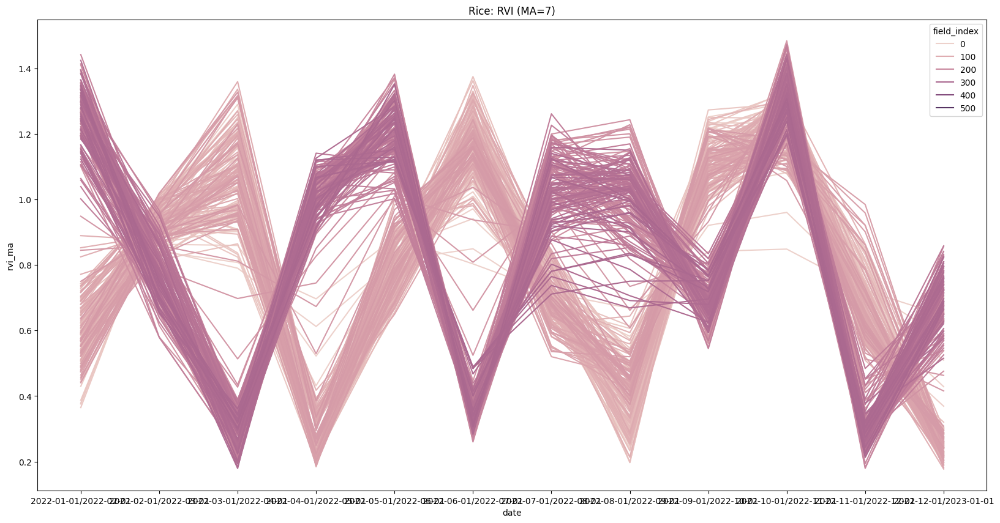

In [76]:
# setting the dimensions of the plot
fig, ax = plt.subplots(figsize=(20, 10))

sns.lineplot(data=df_rice, x="date", y="rvi_ma", hue="field_index").set(title='Rice: RVI (MA=7)')

fig.savefig("data_rice.png") 

In [569]:
df_non_rice = ds.sel(target='Non Rice').to_dataframe()
df_non_rice.shape

(7200, 5)

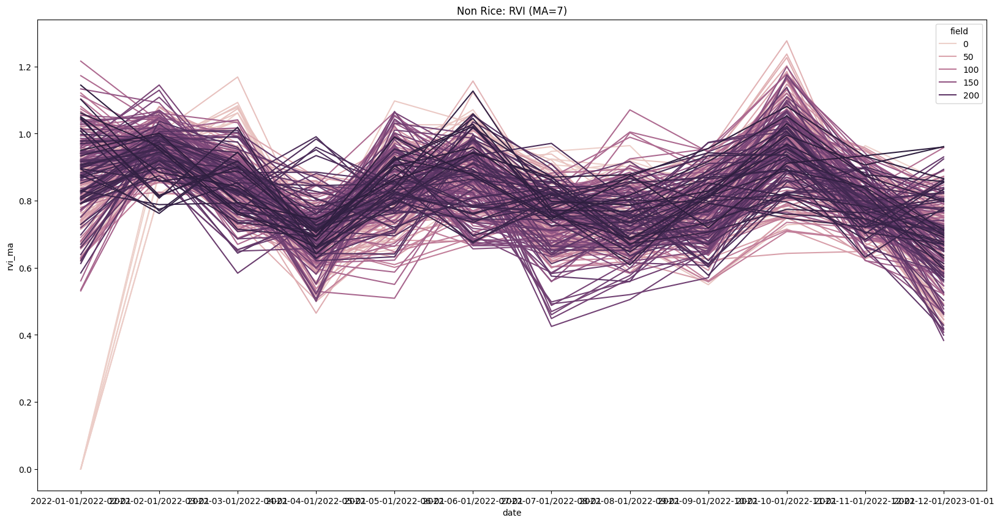

In [571]:
# setting the dimensions of the plot
fig, ax = plt.subplots(figsize=(20, 10))

sns.lineplot(data=ev_full, x="date", y="rvi_ma", hue="field").set(title='Non Rice: RVI (MA=7)')

fig.savefig("data_non_rice.png") 

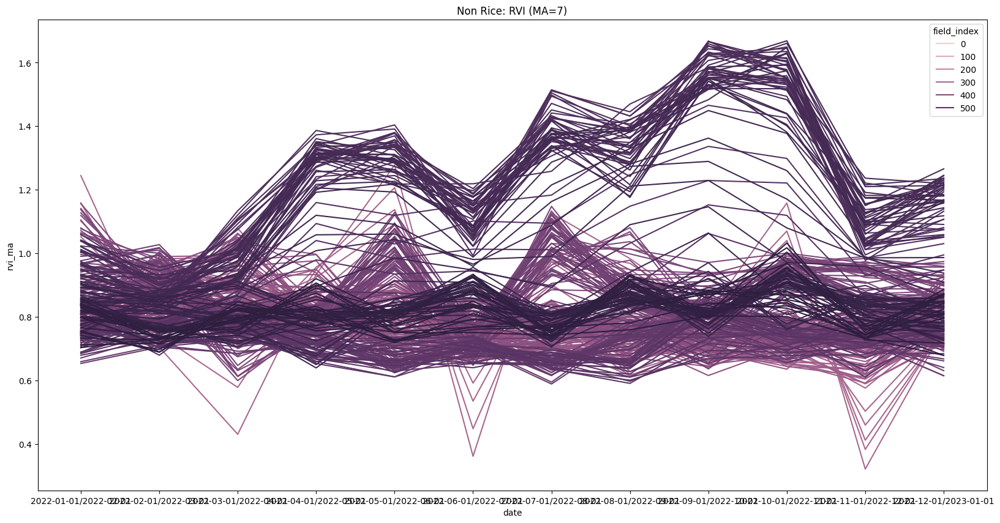

In [78]:
# setting the dimensions of the plot
fig, ax = plt.subplots(figsize=(20, 10))

sns.lineplot(data=df_non_rice, x="date", y="rvi_ma", hue="field_index").set(title='Non Rice: RVI (MA=7)')

fig.savefig("data_non_rice.png") 

## Prepare data

In [651]:
df_full.shape

(14400, 6)

In [634]:
df_full = ev_full.copy()

In [652]:
df_full = df_full.dropna(subset=['vh', 'vv', 'rvi', 'rvi_ma'], how='all')

In [653]:
df_full = df_full.set_index(['field_index', 'date'])

In [654]:
data = df_full.copy()

In [656]:
# Assuming your data is in a pandas Series called 'data'
data = pd.Series(df_full['rvi_ma'].fillna(0))

# Create a DataFrame from your data
df = data.reset_index()
print(df.head())
# Pivot the DataFrame to create a 2D array where each row represents a time series
pivot_df = df.pivot_table(values='rvi_ma', index='field_index', columns='date')

# Convert the pivoted DataFrame to a 2D numpy array
time_series_data = pivot_df.to_numpy()

   field_index                   date    rvi_ma
0            0  2022-01-01/2022-02-01  0.000000
1            0  2022-02-01/2022-03-01  0.841573
2            0  2022-03-01/2022-04-01  0.807760
3            0  2022-04-01/2022-05-01  0.696798
4            0  2022-05-01/2022-06-01  0.883964


In [657]:
data

field_index  date                 
0            2022-01-01/2022-02-01    0.000000
             2022-02-01/2022-03-01    0.841573
             2022-03-01/2022-04-01    0.807760
             2022-04-01/2022-05-01    0.696798
             2022-05-01/2022-06-01    0.883964
                                        ...   
599          2022-08-01/2022-09-01    0.759540
             2022-09-01/2022-10-01    0.803444
             2022-10-01/2022-11-01    0.801254
             2022-11-01/2022-12-01    0.732237
             2022-12-01/2023-01-01    0.796429
Name: rvi_ma, Length: 7200, dtype: float64

## Apply Fast Fourier Transform (FFT)

In [533]:
# Apply FFT to the time series data
time_series_data_fft = np.fft.fft(time_series_data)

# Convert complex numbers to magnitude (absolute value)
time_series_data_magnitude = np.abs(time_series_data_fft)

## Apply Moving Average (MA)

In [614]:
# Apply Simple Moving Average (SMA) with a window size of your choice
window_size = 2
time_series_data_sma = pivot_df.rolling(window=window_size, axis=1).mean()

# Drop any rows with NaN values due to the rolling window operation
time_series_data_sma.dropna(axis=1, inplace=True)

# Convert the pivoted DataFrame with SMA to a 2D numpy array
time_series_data = time_series_data_sma.to_numpy()

## Perform the Clustering

Init 1
0.094 --> 0.072 --> 0.076 --> 
Init 2
0.051 --> 0.055 --> 
Init 3
0.045 --> 0.042 --> 0.055 --> 
Init 4
0.047 --> 0.050 --> 
Init 5
0.052 --> 0.054 --> 
Init 6
0.063 --> 0.061 --> 0.065 --> 
Init 7
0.042 --> 0.044 --> 
Init 8
0.046 --> 0.048 --> 
Init 9
0.068 --> 0.059 --> 0.059 --> 0.061 --> 
Init 10
0.070 --> 0.060 --> 0.071 --> 


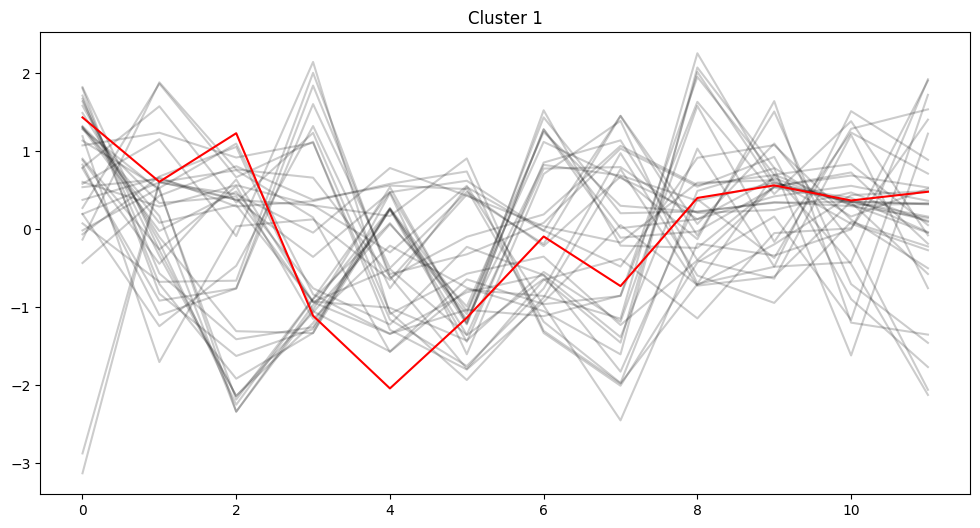

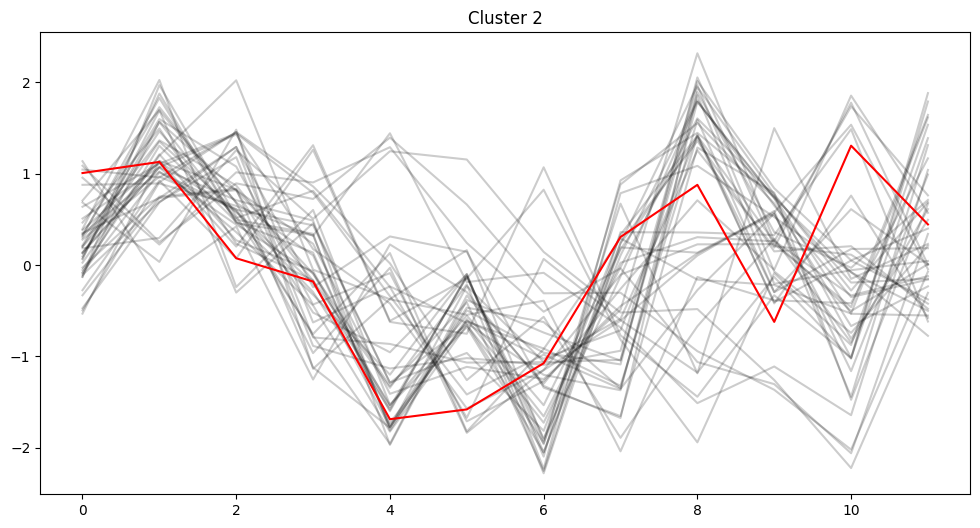

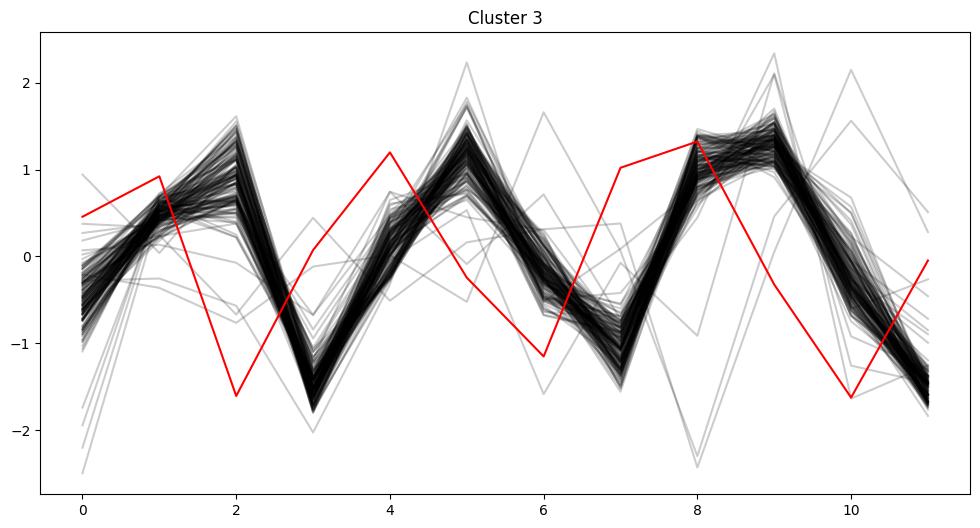

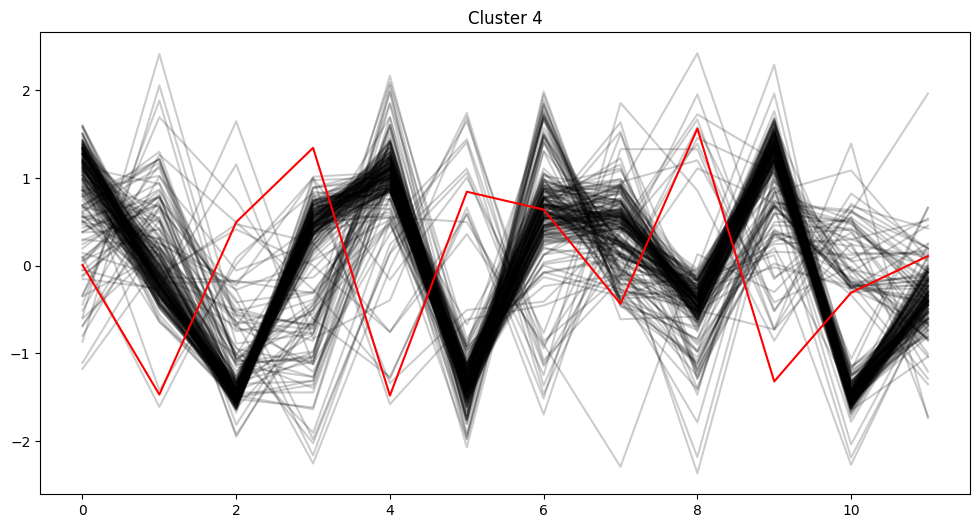

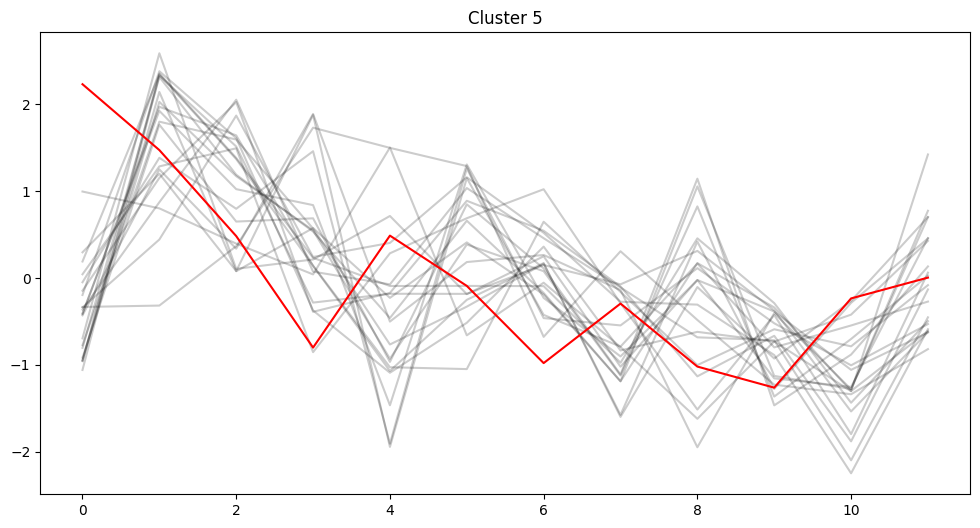

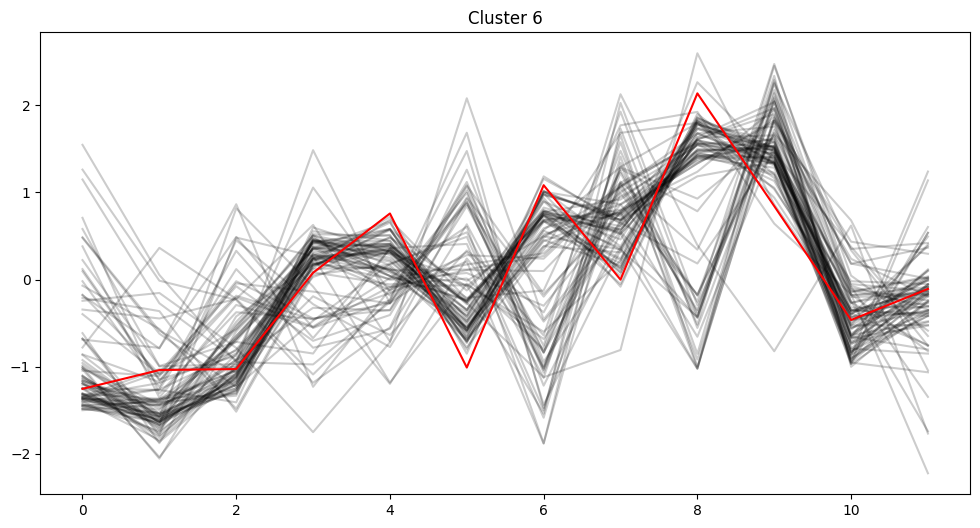

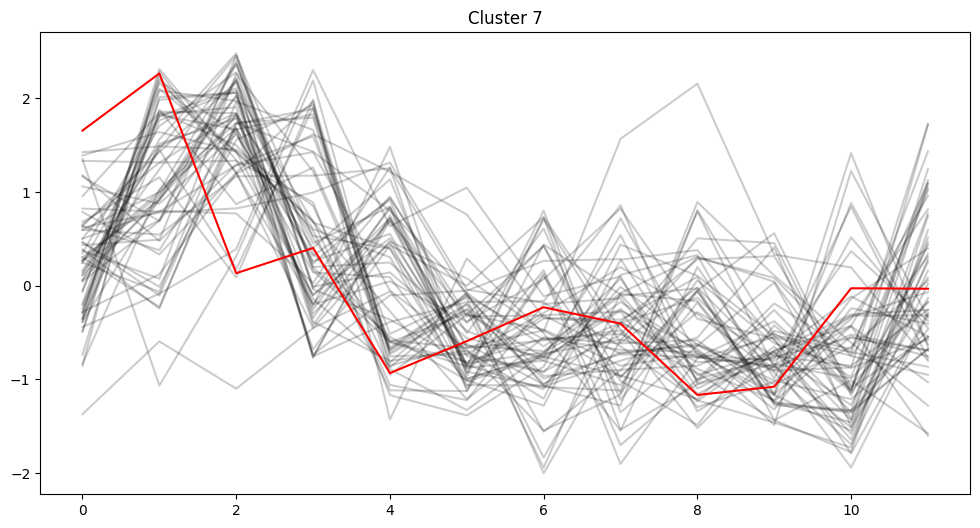

In [658]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

### tslearn silhouette
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.clustering import KShape

n_clusters = 7

# Scale time series
scaler = TimeSeriesScalerMeanVariance(mu=0.0, std=1.0)
time_series_data_scaled = scaler.fit_transform(time_series_data)

# Perform time series clustering using k-Shape
kshape = KShape(n_clusters=n_clusters, n_init=10, verbose=True, random_state=42)
y_pred = kshape.fit_predict(time_series_data_scaled)

# Plot the time series and their cluster assignments
for yi in range(n_clusters):
    plt.figure(figsize=(12, 6))
    for xx in time_series_data_scaled[y_pred == yi]:
        plt.plot(xx.ravel(), "k-", alpha=0.2)
    plt.plot(kshape.cluster_centers_[yi].ravel(), "r-")
    plt.title(f"Cluster {yi + 1}")

plt.show()


In [628]:
time_series_data[0]

array([0.        , 0.9733519 , 1.03745392, 0.71852094, 0.71355184,
       0.84389794, 0.92437901, 0.8476106 , 0.89820353, 0.75360653,
       0.96401411, 0.85475861])

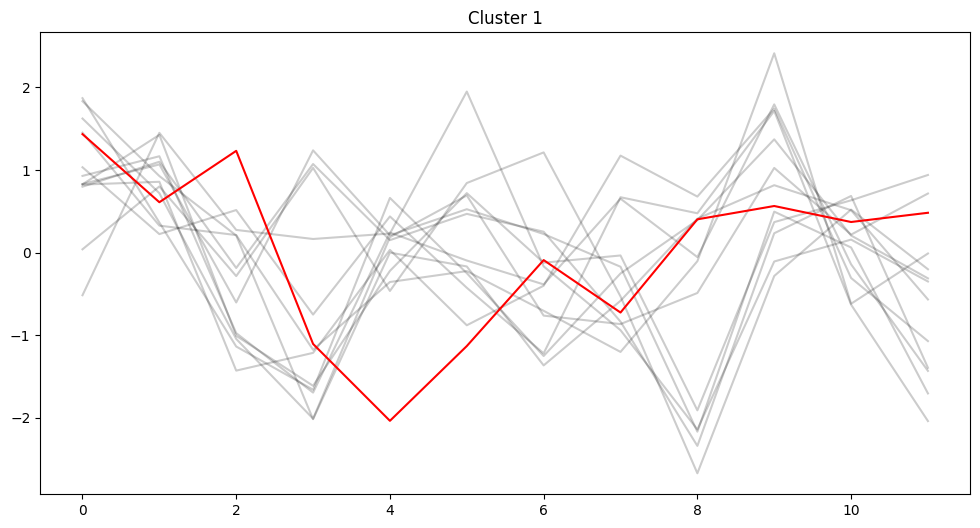

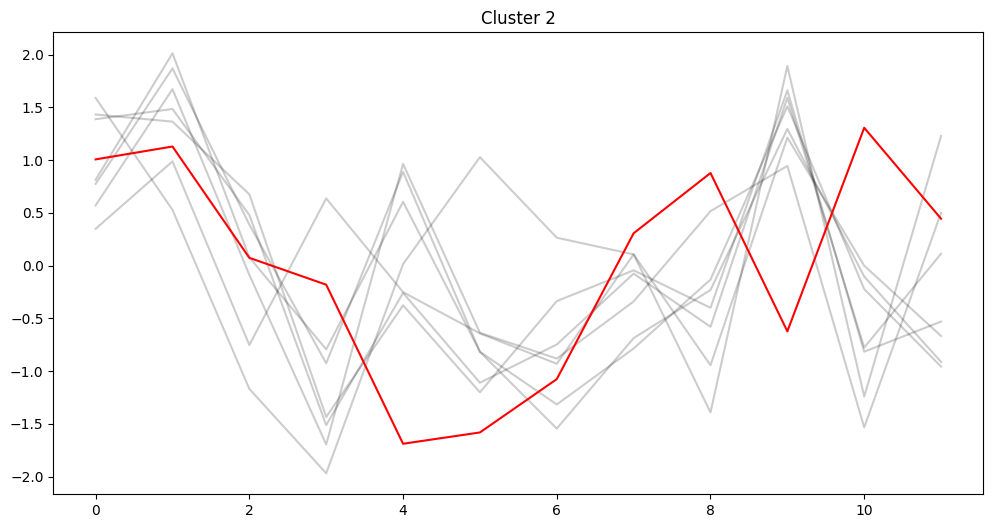

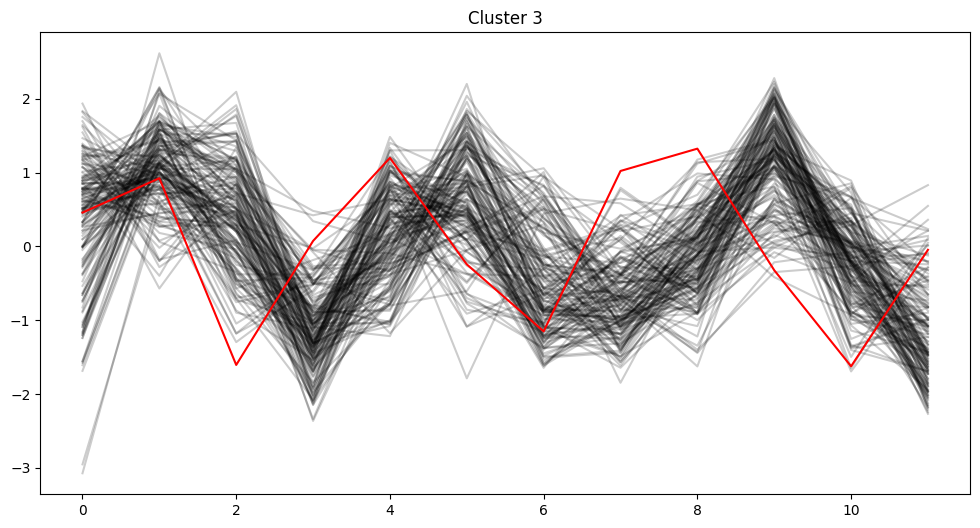

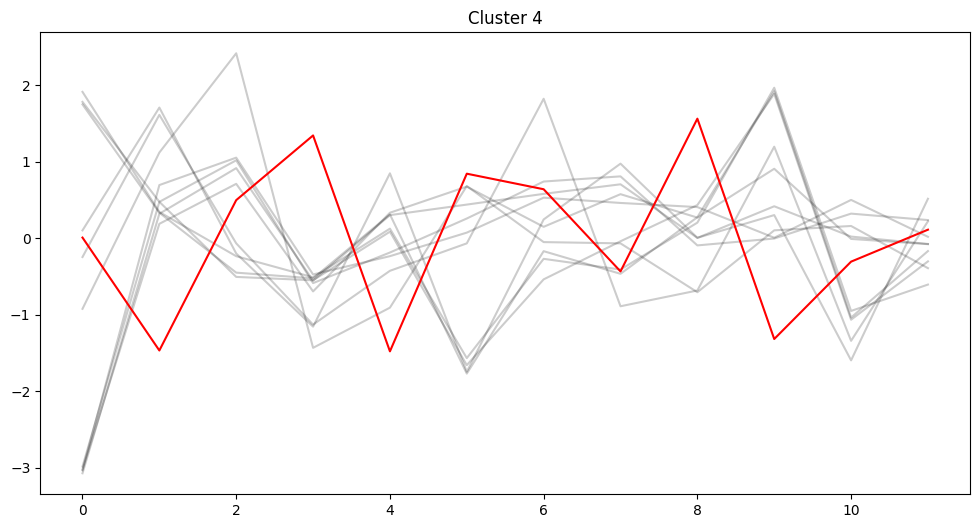

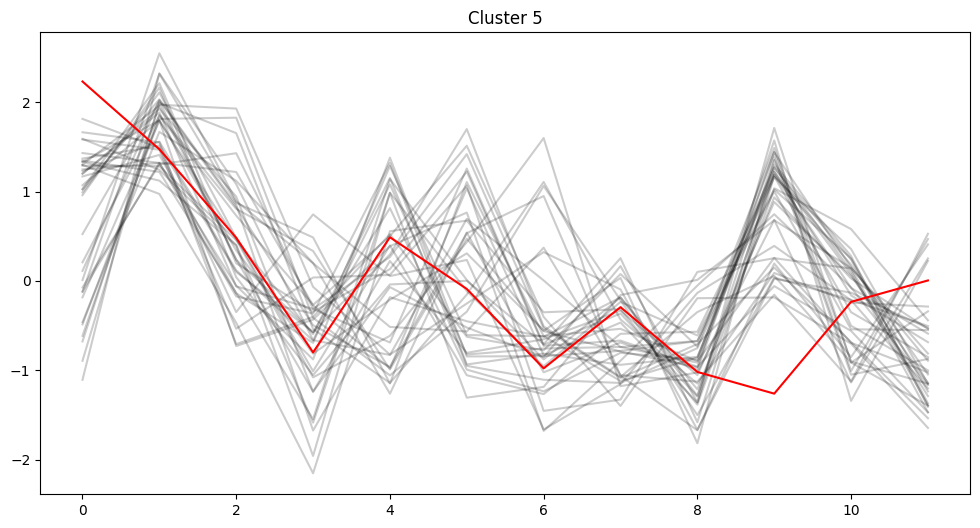

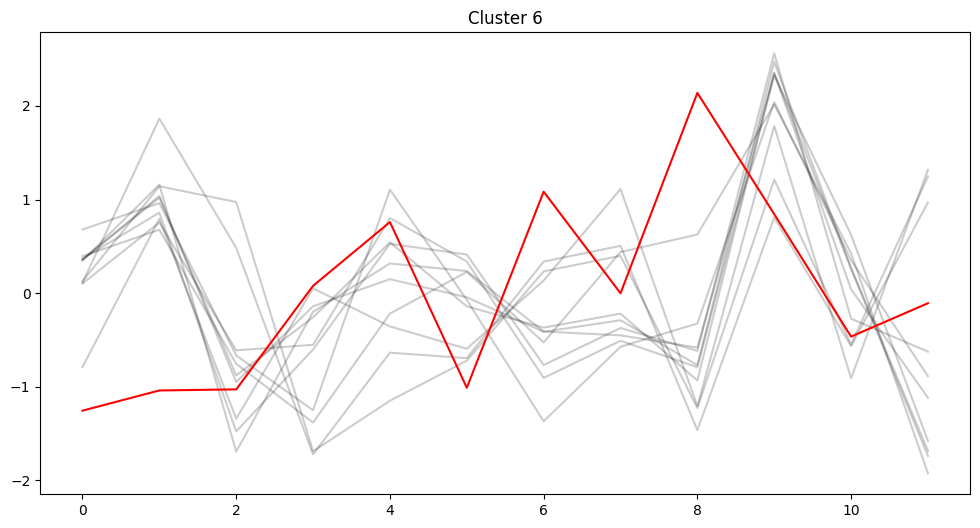

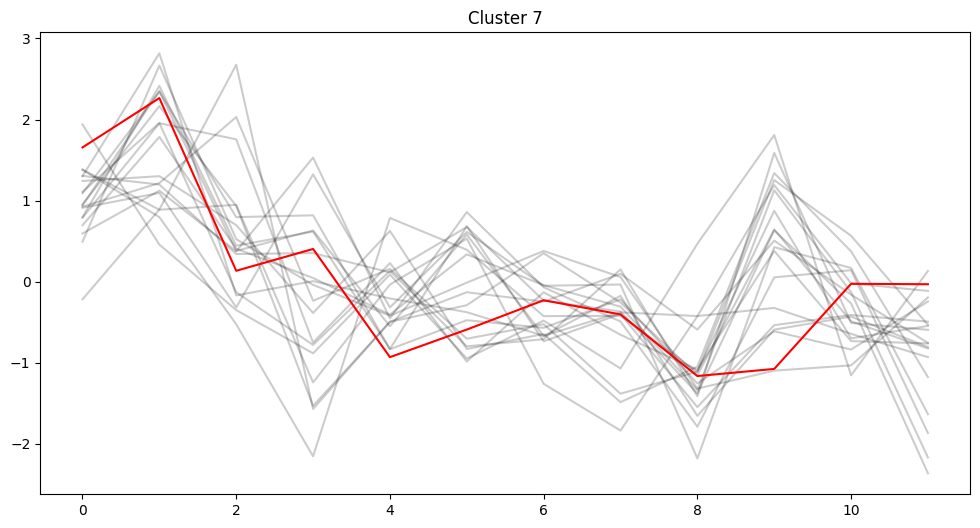

In [638]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

### tslearn silhouette
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.clustering import KShape

n_clusters = 7

# Scale time series
scaler = TimeSeriesScalerMeanVariance(mu=0.0, std=1.0)
time_series_data_scaled = scaler.fit_transform(time_series_data)

# Perform time series clustering using k-Shape

y_pred = kshape.predict(time_series_data_scaled)

# Plot the time series and their cluster assignments
for yi in range(n_clusters):
    plt.figure(figsize=(12, 6))
    for xx in time_series_data_scaled[y_pred == yi]:
        plt.plot(xx.ravel(), "k-", alpha=0.2)
    plt.plot(kshape.cluster_centers_[yi].ravel(), "r-")
    plt.title(f"Cluster {yi + 1}")

plt.show()


## Evaluate

In [659]:
len(time_series_data_scaled)

600

In [660]:
from tslearn.metrics import cdist_dtw
from sklearn.metrics import silhouette_score, davies_bouldin_score



# Calculate the distance matrix using Dynamic Time Warping (DTW)
distance_matrix = cdist_dtw(time_series_data_scaled)

davies = davies_bouldin_score(distance_matrix, y_pred)
# Calculate the silhouette score
silhouette = silhouette_score(distance_matrix, y_pred, metric='precomputed')
print(f"Silhouette score: {silhouette}")
print(f'Davies bouldin score: {davies}')

Silhouette score: 0.32511466082369417
Davies bouldin score: 2.7019995236641896


## Statistical information

In [661]:
# Calculate statistical information for each cluster
for cluster in range(n_clusters):
    cluster_data = time_series_data[y_pred == cluster]

    # Calculate mean and variance
    cluster_mean = np.mean(cluster_data, axis=0)
    cluster_variance = np.var(cluster_data, axis=0)

    # Calculate autocorrelation
    cluster_data_df = pd.DataFrame(cluster_data)
    cluster_autocorr = cluster_data_df.apply(lambda x: x.autocorr(), axis=1).mean()

    print(f"Cluster {cluster + 1}:")
    print(f"Mean: {cluster_mean}")
    print(f"Variance: {cluster_variance}")
    print(f"Average Autocorrelation: {cluster_autocorr}")
    print("\n")

Cluster 1:
Mean: [0.83158875 0.80958212 0.74025343 0.76431705 0.78586359 0.73521255
 0.81196013 0.78767055 0.82351429 0.83434786 0.81854254 0.79874499]
Variance: [0.06653696 0.00632512 0.00492644 0.00636579 0.01392052 0.00324264
 0.02703508 0.0222995  0.00702164 0.0120896  0.01104777 0.01003269]
Average Autocorrelation: 0.08863556469073164


Cluster 2:
Mean: [0.76077856 0.80621506 0.79042688 0.74649319 0.70840291 0.7160604
 0.68669241 0.71794402 0.78066706 0.75068241 0.72405851 0.76700721]
Variance: [0.00197216 0.00112796 0.00201616 0.00272006 0.0059724  0.00213651
 0.00305724 0.00261305 0.00277328 0.00178633 0.00359954 0.00318243]
Average Autocorrelation: 0.19325858531495432


Cluster 3:
Mean: [0.58457232 0.92586611 1.06606066 0.2767868  0.80204272 1.15581615
 0.70444979 0.41332502 1.10299265 1.19938388 0.67916317 0.26937083]
Variance: [0.01881022 0.00286525 0.01671035 0.0114118  0.00674279 0.01188549
 0.00555528 0.01400981 0.00846149 0.00811787 0.00946094 0.00999862]
Average Autocorr

# Data

In [662]:
# Create a DataFrame to store the time series data and the cluster labels
result_df = pivot_df.copy()
result_df['Cluster'] = y_pred

# Calculate statistical information for each cluster and add to the result DataFrame
for cluster in range(n_clusters):
    cluster_data = time_series_data[y_pred == cluster]

    # Calculate mean and variance
    cluster_mean = np.mean(cluster_data, axis=0)
    cluster_variance = np.var(cluster_data, axis=0)

    # Calculate autocorrelation
    cluster_data_df = pd.DataFrame(cluster_data)
    cluster_autocorr = cluster_data_df.apply(lambda x: x.autocorr(), axis=1).mean()

    # Add statistical information to the result DataFrame
    result_df.loc[result_df['Cluster'] == cluster, 'Mean'] = cluster_mean.mean()
    result_df.loc[result_df['Cluster'] == cluster, 'Variance'] = cluster_variance.mean()
    result_df.loc[result_df['Cluster'] == cluster, 'Autocorrelation'] = cluster_autocorr

# Print the result
result_df.head()

date,2022-01-01/2022-02-01,2022-02-01/2022-03-01,2022-03-01/2022-04-01,2022-04-01/2022-05-01,2022-05-01/2022-06-01,2022-06-01/2022-07-01,2022-07-01/2022-08-01,2022-08-01/2022-09-01,2022-09-01/2022-10-01,2022-10-01/2022-11-01,2022-11-01/2022-12-01,2022-12-01/2023-01-01,Cluster,Mean,Variance,Autocorrelation
field_index,,,,,,,,,,,,,,,,
0,0.0,0.841573,0.807760,0.696798,0.883964,0.803519,0.715134,0.668195,0.841399,0.848658,0.722617,0.645882,0,0.795133,0.015904,0.088636
1,0.0,0.846314,0.790300,0.612413,0.814059,0.849617,0.695019,0.582343,0.921048,0.960702,0.728509,0.576973,0,0.795133,0.015904,0.088636
2,0.0,0.863479,0.859740,0.522208,0.851382,0.941563,0.714716,0.501355,1.032338,1.082728,0.702156,0.509662,2,0.764986,0.010336,-0.105744
3,0.0,0.895227,0.901925,0.431608,0.834731,0.971780,0.668375,0.404303,1.065914,1.119994,0.654099,0.428628,2,0.764986,0.010336,-0.105744
4,0.0,0.908831,0.907711,0.352323,0.823155,0.988167,0.644748,0.312362,1.138900,1.176872,0.589190,0.369074,2,0.764986,0.010336,-0.105744


In [663]:
# Save to disk
result_df.to_csv('time_series_clustering.csv', index=False)

In [669]:
preds = pd.read_csv('preds (1).csv')
preds.columns = ['0', "1"]

In [672]:
subm = pd.read_csv('Crop_Location_Data.csv')
subm['target'] = preds['1']

In [677]:
subm.to_csv('fullpreds.csv', index=False)

In [676]:
subm['target'] = subm['target'].replace({0: 'Non Rice', 1: 'Rice'})
subm.head()

,id,target
0,"(10.18019073690894, 105.32022315786804)",Non Rice
1,"(10.561107033461816, 105.12772097986661)",Non Rice
2,"(10.623790611954897, 105.13771401411867)",Non Rice
3,"(10.583364246115156, 105.23946127195805)",Non Rice
4,"(10.20744446668854, 105.26844107128906)",Rice
